## Setup dependencies

In [23]:
import sys
import datetime as dt;

# display python version and date/time
print(dt.datetime.today());
print(sys.version)

# google colab specific code
if 'google.colab' in sys.modules:
    try:
        import google.colab
        import subprocess
        import os.path
        p = subprocess.run(['git', 'rev-parse', '--is-inside-work-tree'], stdout=subprocess.PIPE, universal_newlines=True)
        if p.stdout == 'true\n':
            !git pull
        else:
            if not os.path.isdir('city_dsp_ap'):
                !git clone --depth 1 -q https://github.com/tweyde/city_dsp_ap.git
            %cd city_dsp_ap
    except:
        %cd city_dsp_ap
else:
    print("Skipped google colab specific code");

2021-04-16 08:38:03.873714
3.7.9 (default, Aug 31 2020, 17:10:11) [MSC v.1916 64 bit (AMD64)]
Skipped google colab specific code


In [24]:
from scipy.io import wavfile
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Audio
from scipy import fft, signal
plt.rcParams['figure.figsize'] = (13,6) # increase the default size of the plots

## Controllable delay line (UG) or filter (PG)

You will need to create a function that applies the desired effect to any input signal, where the effect can be dynamically modified by a control signal. The functions only need to be implemented for offline use, so you don't need to be handle input buffers of arbitrary sizes like in lab 6. It suffices to use a single for loop to run over all samples of the input and control signals, and create the output sample-by-sample.

In both cases, the control signal will be a sine of 2Hz. Create one of the required length yourself. Any signal should work as input signal. You can learn how to [upload your own files](https://colab.research.google.com/notebooks/io.ipynb) into Google Colab, but the easiest will be to use one of the wave files available in the `audio` directory. If you're loading a stereo file, it is allowed to mix it down into a single mono channel before passing it to the effect to simplify processing.

In [25]:

%ls audio

 Volume in drive C is OS
 Volume Serial Number is F287-2376

 Directory of C:\Users\jacqu\city\DS2020\Modules\DigitalSignalProcessing\Coursework\CourseworkWip\audio

25/03/2021  15:06    <DIR>          .
25/03/2021  15:06    <DIR>          ..
13/02/2021  11:45            51,328 20-16000HzExp5sec.mp3
13/02/2021  11:45            51,328 20-16000HzLin5sec.mp3
13/02/2021  11:45            34,660 carrier.wav
13/02/2021  11:45         4,365,330 rockA.wav
25/03/2021  15:05           281,672 rockAShort.wav
13/02/2021  11:45         4,365,396 rockB.wav
25/03/2021  15:06           309,332 rockBShort.wav
               7 File(s)      9,459,046 bytes
               2 Dir(s)  60,359,512,064 bytes free


#### PG
Program a controllable FIR filter, i.e. a filter that changes its characteristics over time in response to a control signal. Apply the filter to the signal by implementing a convolution with the filter coefficients in a loop over the samples, just like in lab 7. In order to make the filter respond to the control signal, you can either design two static filters and interpolate between them (like in lab 7), or you can directly manipulate the filter characteristics in the filter design function [`firls`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firls.html) and call it for every iteration.

The following filenames are defined for the wav files used:

In [26]:
# Define wav filenames used:
s1Filename = "audio/carrier.wav"
s2Filename = "audio/rockA.wav"
s3Filename = "audio/rockB.wav"

#### WavClass
A class that encapsulates audio files is coded and tested on the audio samples

In [27]:
#
# Code for audio file loading and conversion to mono
#
import sys

from scipy.io import wavfile
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display

#
# Class that encapsulates the wav file functionality:
# - load a wav file
# - plot the wav file's channel(s)
# - convert to mono using correlation
# - plot results of the search for maximum correlation if the loaded stereo sample needs correcting
#
class WavClass:
    # Class properties:
    # samples the samples as read from the wav file
    # sampleRate the sample rate
    # filename the wav file name
    # isMono boolean if mono samples is 1D, False it is 2D
    # samplesMono the samples converted to mono
    #
    # creates the following class properties:
    # - samples: the signal array, may be 2d for stereo samples
    # - samplesMono: the signal 1d array, of the signal converted to monophonic (one channel)
    # - sampleRate: the sampling rate of the sound samples in Hertz (samples per second)
    # - filename: the wav file name
    # - doPlots: boolean flag to indicate if plots should be created

    # constructor creates the class instance, either by reading a wav file or by taking
    # an array of sound samples and a sample rate.
    # wavFileName: filename to open, or None if the sound data is passed
    # doPlots: True creates plots where appropriate, as methods are called, false creates no plots
    # rawSamples: array of samples, or None if a wav file is read
    # rawSampleRate: the sampling rate in Herz (samples per second) of the samples in the array
    def __init__(self, wavFileName=None, doPlots=False, rawSamples=[], rawSampleRate=None):
        if wavFileName != None:
            self.initFromWavFile(wavFileName, doPlots)
        elif len(rawSamples) > 0:
            self.initFromSamples(rawSamples, rawSampleRate, doPlots)
        self.numSamples = len(self.samplesMono)

    # constructor helper: loads the given file, converts it to 1 channel mono if it is stereo
    # plots the sample, and stereo correlation information.
    # Parameters:
    # - wavFileName: the wav file to load
    # - doPlots: whether to create plots in this and other method calls
    def initFromWavFile(self, wavFileName, doPlots):
        self.sampleRate, samples = wavfile.read(wavFileName);
        # To avoid warnings and errors of the kind:
        #   RuntimeWarning: overflow encountered in short_scalars
        # convert samples from short to float:
        self.samples = samples.astype(np.float)
        self.filename = wavFileName;
        self.doPlots = doPlots
        self.preprocessSamples()

    # constructor helper: receives a samples array , converts it to 1 channel mono if it is stereo
    # plots the sample, and stereo correlation information.
    # Parameters:
    # - samples: the sound samples in an array, 1d if mono, 2d if stereo
    # - sampleRate: the sampling rate in Herz (samples per second) of the samples in the array
    # - doPlots: whether to create plots in this and other method calls
    def initFromSamples(self, samples, sampleRate, doPlots):
        self.samples = samples.astype(np.float)
        self.sampleRate = sampleRate
        self.filename = "RawSamplesSUpplied.noFile"
        self.doPlots = doPlots
        self.preprocessSamples()

    # check DC offset (mean) of samples is greater than 0.1, if not, adjust the offset by subtracting the mean
    # if the samples member is two dimensional, try converting to mono
    # stores the conversion to mono in self.samplesMono
    def preprocessSamples(self):
        # is this a stereo sample?
        if (self.samples.ndim == 2):
            display("Read file: {} {} samples, rate {}".format(self.filename, len(self.samples[:, 0]), self.sampleRate))
            mean1 = np.mean(self.samples[:, 0])
            mean2 = np.mean(self.samples[:, 0])
            # adjust DC offset of channel 1?
            if abs(mean1) > 0.1:
                display("Adjusting DC offset Channel0 Mean: {} Variance: {} Std Dev: {} median {}".format(np.mean(self.samples[:, 0]),
                                                                                  np.var(self.samples[:, 0]),
                                                                                  np.std(self.samples[:, 0]),
                                                                                  np.median(self.samples[:, 0])))
                self.samples[:,0] = self.samples[:,0] - mean1
            # adjust DC offset of channel 2?
            if abs(mean2) > 0.1:
                display("Adjusting DC offset Channel1 Mean: {} Variance: {} Std Dev: {}".format(np.mean(self.samples[:, 1]),
                                                                        np.var(self.samples[:, 1]),
                                                                        np.std(self.samples[:, 1]),
                                                                        np.median(self.samples[:, 0])))
                self.samples[:, 1] = self.samples[:, 1] - mean1
            # convert to mono
            self.convertToMono()
        else:
            # it's a set of mono (1d array) of samples
            display("Read file: {} {} samples, rate {}".format(self.filename, len(self.samples), self.sampleRate))
            mean = np.mean(self.samples)
            # adjust DC offset?
            if mean > abs(0.1):
                #adjust dc offset
                display("Adjusting DC offset. Channel Mean: {} Variance: {} Std Dev: {}".format(np.mean(self.samples),
                                                                      np.var(self.samples),
                                                                      np.std(self.samples),
                                                                      np.median(self.samples)))
                self.samples = self.samples - mean
            self.samplesMono = self.samples
            self.plotMono("One Channel Sample File Plot")


    # Convert the stereo sample to a mono sample, displays a plot of samples and conversion
    # store the mono version in self.samplesMono
    # expects self.samples to be 2 dimensional
    def convertToMono(self):
        display("Convert to mono: {}".format(self.filename))
        # calculate correlation coefficient
        rawCoeff = np.dot(self.samples[:, 0], self.samples[:, 1]) / np.sqrt(np.dot(self.samples[:, 0], self.samples[:, 0]) * np.dot(self.samples[:, 1], self.samples[:, 1]))
        self.samplesMono = self.samples[:, 0] / 2 + self.samples[:, 1] / 2;
        if abs(rawCoeff) >= 0.8:
            # no need to correct the samples
            # plot them:
            self.plotStereo("Good conversion to mono abs(correlation coefficient) >= 0.8: {}".format(abs(rawCoeff)));
        else:
            # samples need correcting, plot the original:
            self.plotStereo("Poor conversion to mono abs(correlation coefficient) < 0.8, needs phase alignment: {}".format(abs(rawCoeff)))
            # correct the samples
            if (rawCoeff < 0):
                # negative value implies there is cancellation happening, invert one of the channels as well as checking
                # for correlation again, possibly shifting one channel so that it is in phase with the other channel
                display("One channel needs inverting, the correlation coefficient is < 0")
                self.alignSamples(flipChannel=0)
            else:
                # no inverting the sign of one channel is needed, but shifting one channel may be necessary to make it
                # in phase with the other channel
                self.alignSamples()

            # now the samples have been preprocessed, convert the channels to mono into self.monoSamples
            # convert to mono
            self.samplesMono = self.samples[:, 0]/2 + self.samples[:, 1]/2;
            # plot the corrected samples
            self.plotStereo("Aligned conversion to mono (correlation coefficient was < 0.8): {}".format(abs(rawCoeff)))
        self.plotMono("Resulting Mono Sample")

    # Using Audacity, on RockA.wav, it can be seen that the stereo channels are not in phase,
    # and one channel has been inverted. This function finds how many samples to shift using correlation and inverts (if needed)
    # the respective channels
    # input:
    #   flipChannel: channel to invert, None if no inversion needed
    #
    def alignSamples(self, flipChannel=None):
        # correlation coefficients for each channel offset
        # only up to sample rate is checked to see if the channels are out of phase.
        correlationCoefficients = np.zeros(self.sampleRate)
        # subset of channel 1 to check for max correlation
        channel1Section = self.samples[0:self.sampleRate,0]
        # subset of channel 2 to check for max correlation
        channel2Section = self.samples[0:self.sampleRate,1]
        # start off with the right shifted channel1 section as an unshifted copy of channel1Section
        channel1RightShift = channel1Section
        # the maximum correlation coefficient between channels 1 & 2 so far
        maxCoefficient = 0.0
        # the index in the correlationCoefficients of the maximum coefficient found:
        maxCoefficientIndex = 0

        #Invert the sign of one channel?
        if flipChannel != None:
            self.samples[:,flipChannel] = self.samples[:,flipChannel] * -1
            # check correllation maybe this fixed the correlation
            rawCoeff = np.dot(self.samples[:, 0], self.samples[:, 1]) / np.sqrt(np.dot(self.samples[:, 0], self.samples[:, 0]) * np.dot(self.samples[:, 1], self.samples[:, 1]))
            if abs(rawCoeff) > 0.8:
                return

        # loop shifting channel 1 to the right to find the highest correlation coefficient between channel 1 & 2
        # look at 1 tenth of a second's worth of samples
        for offset in range(0,int(self.sampleRate/10)):
            # calculate the correlation coefficient of the two channels at the currently shifted position
            correlationCoefficients[offset] = np.dot(channel1RightShift, channel2Section) / np.sqrt(np.dot(channel1RightShift, channel1RightShift) * np.dot(channel2Section, channel2Section))
            # shift channel 1 by prepending zero
            channel1RightShift = np.concatenate([np.zeros(1), channel1RightShift])
            # pad channel 2 by appending zero
            channel2Section = np.concatenate([channel2Section, np.zeros(1)])
            # if the current max correlation coefficient is less than the one just calculated,
            # update maxCoefficient
            if maxCoefficient < correlationCoefficients[offset]:
                maxCoefficient = correlationCoefficients[offset]
                maxCoefficientIndex = offset
        # plot the correlation coefficients
        self.plotChannelAlignmentCorrelationCoefficientSearch(correlationCoefficients, maxCoefficientIndex)
        # if the correlation coefficient is > 0.8, we can correct the stereo sample
        if maxCoefficient > 0.8:
            # channel1 is prepended with maxCoefficientIndex zeros (right shifted)
            channel1 = self.samples[:,0]
            channel1 = np.concatenate((np.zeros(maxCoefficientIndex), channel1), axis=None)
            # channel 2 is appended with zeros to make length same as channel1
            channel2 = self.samples[:,1]
            channel2 = np.concatenate((channel2, np.zeros(maxCoefficientIndex)), axis=None)
            # new in phase stereo is constructed
            self.samples = np.transpose(np.array([channel1, channel2]))

    # plot the results of the search for the maximum correlation coefficient
    # Input: correlationCoefficients 1d array of correlation coefficients
    #        maxCoefficientIndex index in the array of the correlation coefficient that is the largest
    def plotChannelAlignmentCorrelationCoefficientSearch(self, correlationCoefficients, maxCoefficientIndex):
        if not self.doPlots:
            return
        # plot all correlation coefficients calculated
        fig = plt.figure()
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(correlationCoefficients[0:maxCoefficientIndex + 10])
        ax.set_title("correlationCoefficients")
        ax.set_xlabel("Channel 1 right shift value")
        ax.set_ylabel("Channel 1&2 correlation coefficient")

        # set xaxis labels
        ticks = np.array(range(maxCoefficientIndex + 10))
        labels = ticks.astype(str)
        ax.set_xticks(ticks)
        ax.set_xticklabels(labels)
        plt.grid()
        plt.show()
        print("Max coefficient: ", correlationCoefficients[0:maxCoefficientIndex])

    # Plot stereo samples, and mono samples on the same graph to see the result of
    # a conversion from stereo to mono
    # - title: title to give to the plot
    def plotStereo(self, title):
        if not self.doPlots:
            return

        fig, ax1 = plt.subplots()
        ax1.set_title(title)
        ax1.plot(self.samples[:,0], label="Ch. 1", alpha=0.35, color='green')
        ax1.plot(self.samples[:,1], label="Ch. 2", alpha=0.35, color='orange')
        ax1.plot(self.samplesMono, label="Mono", alpha=0.35, color='blue')
        ax1.legend(loc = 4)
        ax1.set_xlabel("Sample Number")
        ax1.set_ylabel("Amplitude")
        plt.show()

    # Plot monophonic (mono) samples
    # - title: title to give to the plot
    def plotMono(self, title):
        if not self.doPlots:
            return
        fig, ax1 = plt.subplots()
        ax1.set_title(title)
        ax1.plot(self.samplesMono, 'b')
        ax1.set_xlabel("Sample Number")
        ax1.set_ylabel("Amplitude")
        plt.show()


#### Load carrier.wav

'Read file: audio/carrier.wav 34616 samples, rate 12000'

'Adjusting DC offset. Channel Mean: 135.74768892997457 Variance: 1087.9363391239426 Std Dev: 32.98387998892706'

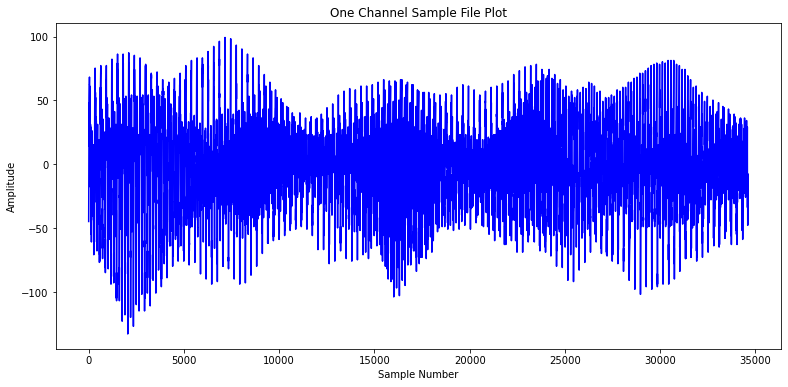

In [28]:
wavClass = WavClass(s1Filename, doPlots=True)
display(Audio(wavClass.samples, rate=wavClass.sampleRate));


#### Notes
- The file carrier.wav has only one channel (mono)
- Sampling rate is 12000 samples per second
- 34616 samples
- The mean value of the samples is 135.75, it should be appriximately zero. The DC offset was adjusted by subtracting the mean from the samples

#### Load rockA.wav


'Read file: audio/rockA.wav 545652 samples, rate 44100'

'Convert to mono: audio/rockA.wav'

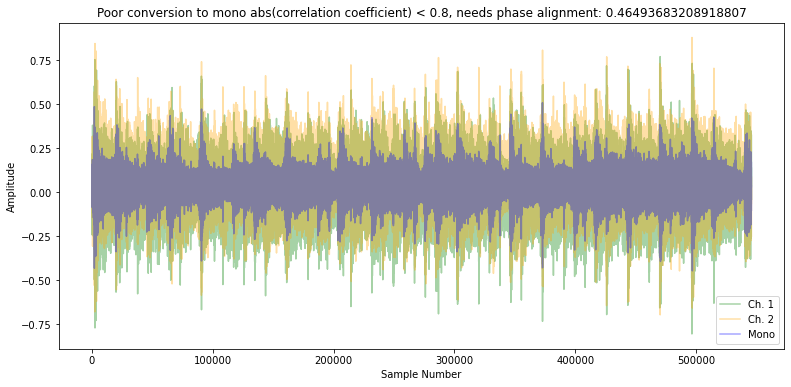

'One channel needs inverting, the correlation coefficient is < 0'

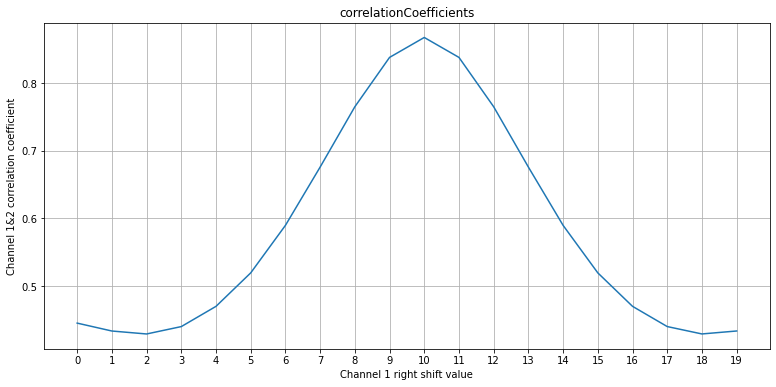

Max coefficient:  [0.44506161 0.43338292 0.42900826 0.43993318 0.46984473 0.51931617
 0.58956092 0.6757242  0.76489066 0.83783633]


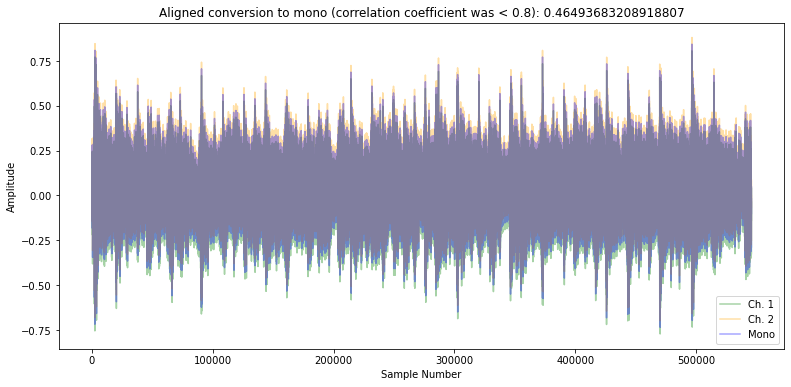

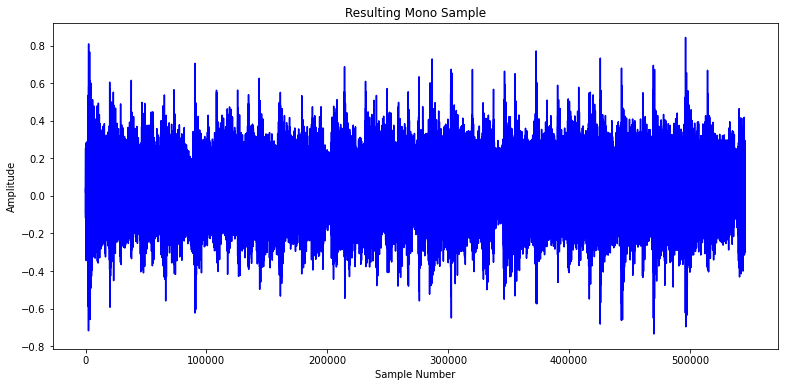

In [29]:
wavClass = WavClass(s2Filename, doPlots=True)
display(Audio(wavClass.samplesMono, rate=wavClass.sampleRate));

#### Notes
- The file RockA.wav is stereo, 44100 samples per second sampling rate, 545652 samples per channel.
- The plot displays the first audio channel, overlays the second audio channel, then finally overlays the result of
combining both channels to a single mono channel.
- The effect of the poor correlation between the two channels
is clearly visible.
- The correlation coefficient of of the channels is poor: -0.4649.
- The file samples are corrected: channel 1 is inverted and shifted to the right by the number of samples that
give the highest correlation coefficient.
- The corrected stereo sample is converted to mono: The corrected stereo sample is plotted to show the effect of correcting the sample
before converting it to mono.
- After conversion there are 10 more samples, due to shifting one channel and zero padding the other.

The correlation coefficient search is based on Steven W. Smith, Digital Signal Processing, Chapter 7, Correlation radar example.

#### Load rockB.wav

'Read file: audio/rockB.wav 545652 samples, rate 44100'

'Convert to mono: audio/rockB.wav'

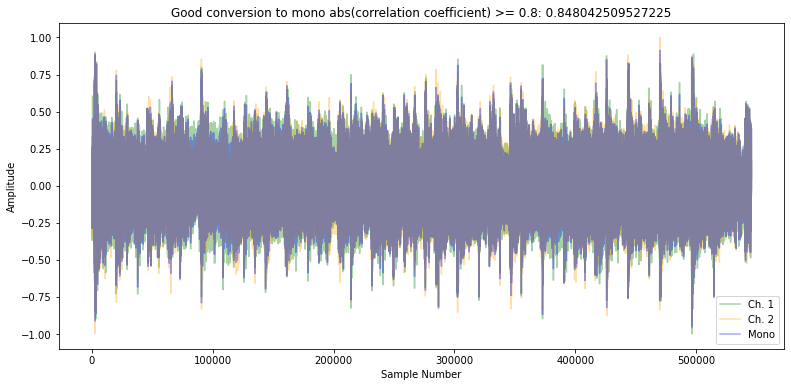

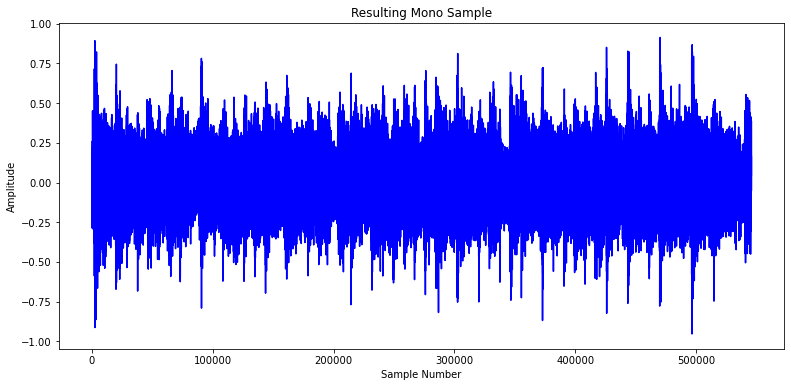

In [30]:
wavClass = WavClass(s3Filename, doPlots = True)
display(Audio(wavClass.samplesMono, rate=wavClass.sampleRate));

#### Notes
- The file RockB.wav is stereo, 545652 samples per channel, 44100 samples/second sampling rate
- There is a good correlation (0.84804) between the two channels.
- The graph shows that the conversion closely
matches the two channels.
- The audio rendered is a good combination of both channels.

#### ControlClass
A class is coded to implement a control signal that is used by the modulated FIR filter

In [31]:
class ControlClass:

    # generate a repeating sine control:
    # size of control signal is the same as the sample size

    # constructor
    # Input:
    #  sampleRate: sample rate of signal to produce (44100 is common)
    #  numSamples: the size of the array of sines to return
    #  frequency: the frequency of the sine wave(s) wanted
    #  amplitude: the maximum value of the sine
    # doPLot: if true a the control signal is plotted
    # Sets member:
    #  self.controlSignal: array of repeating sines
    def __init__(self, sampleRate, numSamples, frequencyHz=2, maxAmplitude=1.0, doPlot=False):
        self.sampleRate = sampleRate
        self.numSamples = numSamples
        self.frequency = frequencyHz
        self.maxAmplitude = maxAmplitude

        # number points for 2hz sine for given sample rate:
        numPoints = sampleRate / frequencyHz  # eg: 2 hertz = 2 samples per second
        # points needed to represent the sine control signal:
        timepoints = np.arange(0, 1, 1 / numPoints)
        # convert the 0-1 values to sine(0-1):
        controlSignal = np.sin(2 * np.pi * frequencyHz * timepoints)
        # apply amplitude factor to sines:
        controlSignal = controlSignal * maxAmplitude
        # repeat the sines to build an array at least as long as numSamples
        repeats = int(numSamples / len(controlSignal)) + 1
        controlSignal = np.tile(controlSignal, repeats)
        # trim off extra values
        controlSignal = controlSignal[:numSamples]
        # plot control signal:
        self.controlSignal = controlSignal
        if doPlot:
            self.plotControlSignal()

    # plot the control signal
    def plotControlSignal(self):
        plt.figure()
        plt.plot(self.controlSignal)
        plt.title("Control Signal (sine {}Hz) s.rate {}, len. {}".format(self.frequency, self.sampleRate, self.numSamples))
        plt.xlabel("Sample Number")
        plt.ylabel('Amplitude')
        plt.ylim(top=1)
        plt.show()

    # get he factor by which the control signal should be multiplied (0 .. 1)
    # from the controlSignal array of sines
    def getControlFactor(self, controlIndex):
        # when convolution is performed, the index goes beyond the
        # length of the input signal by definition of convolution
        # this method reflects back in this case
        if (controlIndex >= self.numSamples):
            controlIndex = (self.numSamples % controlIndex) - self.numSamples
        return self.controlSignal[controlIndex % self.numSamples]

    # interpolate 2 filters using the given controlFactor (between 0 and 1)
    # return a the interpolated filter
    def interpolateFilters(self, controlIndex, filterMin, filterMax):
        # get the multiplication factor
        controlFactor = self.getControlFactor(controlIndex)
        # proportion of filterMin to use
        interpolated1 = filterMin * controlFactor
        # proportion of filerMax to use
        interpolated2 = filterMax * (1 - controlFactor)
        # return the sum of the 2 filter proportions
        return interpolated1 + interpolated2

Test the control class

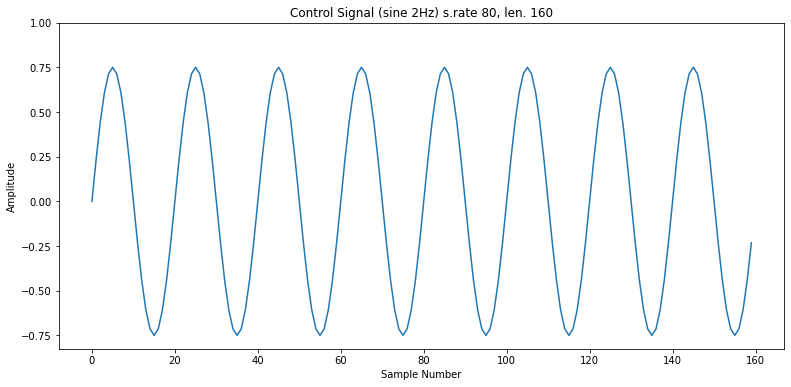

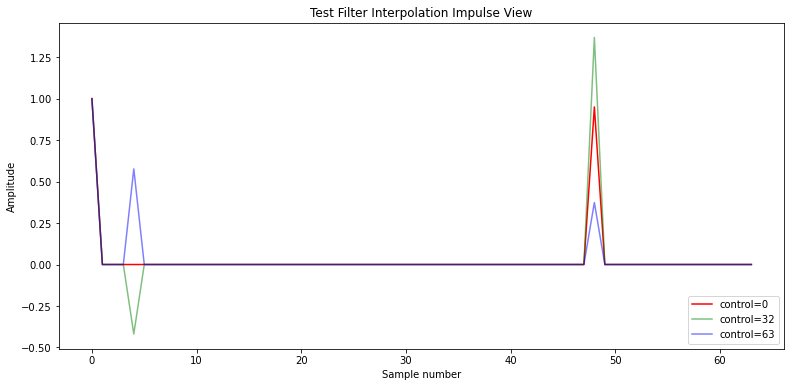

In [32]:
# create a control for a sample rate of 80, 160 samples, maximum amplitude 0.75
control = ControlClass(sampleRate=80, numSamples=160, maxAmplitude=0.75, doPlot=True)
# filter 1 impulse signal: [1...0.95..........]
filterMin = np.zeros(64)
filterMin[0] = 1
filterMin[4] = 0.95
# filter 2 impulse signal: [1..........0.95...]
filterMax = np.zeros(64)
filterMax[0] = 1
filterMax[48] = 0.95
plt.figure()
plt.plot(control.interpolateFilters(0, filterMin, filterMax), 'r', label="control=0")
plt.plot(control.interpolateFilters(32, filterMin, filterMax), 'g', alpha = 0.5, label = "control=32")
plt.plot(control.interpolateFilters(63, filterMin, filterMax), 'b', alpha = 0.5, label="control=63")
plt.title("Test Filter Interpolation Impulse View")
plt.xlabel("Sample number")
plt.ylabel("Amplitude")
plt.legend(loc=4)
plt.show()

#### Notes
Given a sample rate of 80 samples per second, 160 samples, a maximum control amplitude of 0.75
, the control class creates a member variable controlSignal:
- An array of 160 values that represent sine waves that fill the array, for the requested frequency.
Two filters are created (min and max for interpolation), 64 floats long.
- The min filter is all zero's, with index 0 set to 1 and index 4 set to 0.95
- The max filter is all zero's, with index 0 set to 1 and index 48 set to 0.95
The interpolation plot shows the impulse filter interpolated at the minimum, atan index of 32 (middle) and maximum


#### ConvolutionClass
A convolution class is coded to perform the convolution of a signal with a filter.
W. Smith, Digital signal processing, Chapter 6, explains input side and output side convolution. Both methods are implemented.
 The convolution integrates modulation by a control signal, and is capable of performing convolution on
 a mono or stereo signal.

In [33]:
class ConvolutionClass:
#
# The class encapsulates the functionality required to implement the convolution of an input signal.
# The class uses a control signal to modulate the filter kernel used to generate the convolved output signal.
#
    # Constructor:
    # filter1 and filter 2 are the two two static filters (arrays) that the control signal interpolates between
    # control is the control signal used to modulate the output of the convolution
    def __init__(self, filter1, filter2, control):
        self.filter1 = filter1
        self.filter2 = filter2
        self.control = control

    # convolve the input signal using input side convolution
    # output of convolution is the length of the signal + the length of the filter kernel - 1
    # W. Smith, Digital signal processing, Chapter 6.
    def convolveInputSide(self, signal):
        isStereo = False
        filterLength = len(self.filter1)
        # initialise output array, get length of signal. NOte the length of the array is the length of the signal + the
        # filter length, to allow for convolution's operation which generates extra values.
        # Once the convolution has completed, the extra values at the end of the output are trunctated
        # both of these operations differ between mono and stereo (1d and 2d array access)
        if signal.ndim == 2:
            # stereo
            signalLength = len(signal[:,0])
            output = np.zeros(signalLength + filterLength - 1)
            isStereo = True
            output = np.transpose(np.array([output, output]))
        else:
            # mono
            signalLength = len(signal)
            output = np.zeros(signalLength + filterLength - 1)

        # for each sample in the signal
        for signalIndex in range(signalLength):
            for kernelIndex in range(filterLength):
                # create interpolated filter using the control signal as a factor for interpolation
                filter = self.control.interpolateFilters(signalIndex, self.filter1, self.filter2)
                # convolve the sample and store it in the output
                if isStereo:
                    output[signalIndex + kernelIndex, 0] = output[signalIndex + kernelIndex, 0] + signal[signalIndex, 0] * \
                                                        filter[kernelIndex]
                    output[signalIndex + kernelIndex, 1] = output[signalIndex + kernelIndex, 1] + signal[signalIndex, 1] * \
                                                        filter[kernelIndex]
                else:
                    output[signalIndex + kernelIndex] = output[signalIndex + kernelIndex] + signal[signalIndex] * \
                                                        filter[kernelIndex]
        # return the truncated output (remove padding added for the filter length at the start)
        if isStereo:
            return output[:-(len(filter) - 1),:]
        else:
            return output[:-(len(filter) - 1)]

    # Convolve the input signal using output side convolution
    # output of convolution is the length of the signal + the length of the filter kernel - 1
    # W. Smith, Digital signal processing, Chapter 6.
    def convolveOutputSide(self, signal):
        isStereo = False
        filterLength = len(self.filter1)
        # initialise output array, get length of signal. NOte the length of the array is the length of the signal + the
        # filter length, to allow for convolution's operation which generates extra values.
        # Once the convolution has completed, the extra values at the end of the output are trunctated
        # both of these operations differ between mono and stereo (1d and 2d array access)
        if signal.ndim == 2:
            # stereo
            signalLength = len(signal[:, 0])
            output = np.zeros(signalLength + filterLength - 1)
            isStereo = True
            output = np.transpose(np.array([output, output]))

        else:
            # mono
            signalLength = len(signal)
            output = np.zeros(signalLength + filterLength - 1)

        # the array to iterate over is the output array, with space padded with zero's (the length of the filter).
        outputRange = signalLength + filterLength - 1
        kernelRange = len(self.filter1)
        # for each output sample
        for outputIndex in range(outputRange):
            # calculate the value of the output sample
            for kernelIndex in range(kernelRange):
                filter = self.control.interpolateFilters(outputIndex, self.filter1, self.filter2)
                # is this outside the output array's bounds? If so do not try to set it
                if (outputIndex - kernelIndex < 0) or (outputIndex - kernelIndex > (len(signal) - 1)):
                    # don't do anything
                    pass
                else:
                    # multiply the input sample by the impulse response
                    if isStereo:
                        output[outputIndex, 0] = output[outputIndex, 0] + filter[kernelIndex] * signal[
                            outputIndex - kernelIndex, 0]
                        output[outputIndex, 1] = output[outputIndex, 1] + filter[kernelIndex] * signal[
                            outputIndex - kernelIndex, 1]
                    else:
                        output[outputIndex] = output[outputIndex] + filter[kernelIndex] * signal[outputIndex - kernelIndex]
        # return the truncated output (remove padding added for the filter length at the start)
        if isStereo:
            return output[:-(len(self.filter1) - 1), :]
        else:
            return output[:-(len(self.filter1) - 1)]

    # Plot signal 1 (original signal) and signal 2 (filtered version) 1d (mono) arrays
    # expects 1d signal
    def plotSignals(self, signal1, signal2, title):
        plt.figure()
        plt.plot(signal1, 'r', label='Original')
        plt.plot(signal2, 'b', alpha=0.5, label='Filtered')
        plt.title(title)
        plt.legend(loc=4)
        plt.xlabel("Sample Number");
        plt.ylabel("Amplitude");
        plt.show()

    #
    # plot the two given signals (stereo) over each other, one plot per channel
    #
    def plotTwoSignals(self, signal1, signal2, title):
        if signal1.ndim == 2:
            title1 = "{} Channel 1".format(title)
            self.plotSignals(signal1[:,0], signal2[:,0], title1)
            title2 = "{} Channel 2".format(title)
            self.plotSignals(signal1[:, 1], signal2[:, 1], title2)
        else:
            self.plotSignals(signal1, signal2, title)

Test the convolution class:

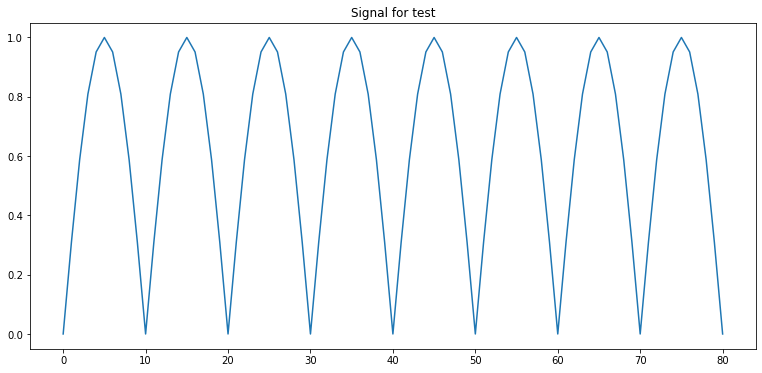

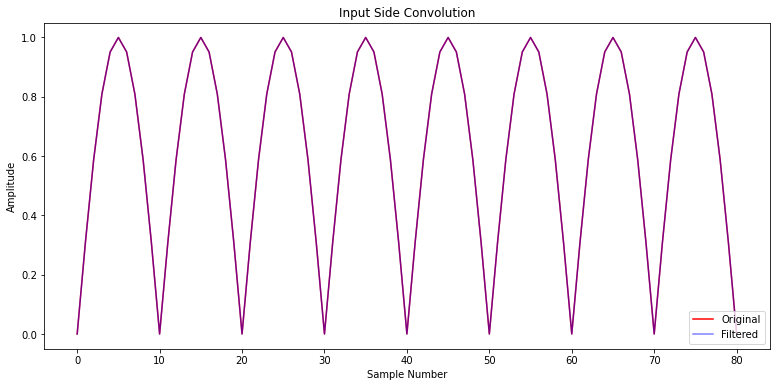

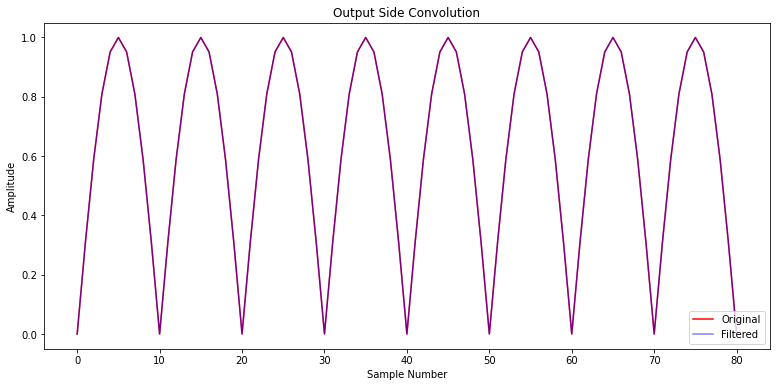

In [34]:
# dummy control signal generator: does no interpolation
class MockControlClass:
    def getControlFactor(self, controlIndex):
        return 1

    # interpolate 2 filters using the given controlFactor (between 0 and 1)
    # return a the interpolated filter
    def interpolateFilters(self, controlIndex, filterMin, filterMax):
        return filterMin

sig = np.abs(np.sin(2 * np.pi * 0.05 * np.arange(-80, 1)))
plt.figure()
plt.plot(sig)
plt.title("Signal for test")
plt.show()
#control = ControlClass()
filter = np.zeros(64)
filter[0] = 1
# in this test there is no convolution
control = MockControlClass()
control.controlSignal = filter
conv = ConvolutionClass(filter, filter, control)
inputSide = conv.convolveInputSide(sig)
outputSide = conv.convolveOutputSide(sig)
pythonConv = signal.convolve(filter, sig)
pythonConv = pythonConv[:(len(filter) - 1)]
conv.plotSignals(sig, inputSide, "Input Side Convolution")
conv.plotSignals(sig, inputSide, "Output Side Convolution")


The input and output side convolution produce the same output as the input signal, if there is no filtering.

#### CombFilterClass
Finally a comb filter class is implemented that is capable of taking a sample, and applying a modulated filter to it.

In [35]:
class CombFilterClass:
    #
    # Modulated Comb filter class: modulated between 2 filters whose
    # delay is above 20 Hz in order to create an effect in the audible frequency spectrum
    #

    #
    # constructor.
    # controlClass: the control signal calss instance used to modulate the filter
    # minDelay: minimum signal delay produced
    # maxDelay: maximum signal delay produced
    # filterSize: size of the filter to create
    # doPlot plot filter created: True yes, False no.
    def __init__(self, controlClass, minDelay=2, maxDelay=1022, filterSize=1024, doPlot=False):
        self.doPlot = doPlot
        # impulse signal for filter1
        filterMin = np.zeros(filterSize)
        filterMin[0] = 1
        filterMin[minDelay] = 0.75
        # impulse signal for filter 2
        filterMax = np.zeros(filterSize)
        filterMax[0] = 1
        filterMax[maxDelay] = 0.75
        self.filterMin = filterMin
        self.filterMax = filterMax
        if (self.doPlot):
            self.plotFilters()

        self.convolutionClass = ConvolutionClass(filterMin, filterMax, controlClass)

    # plot the given filters, overlayed
    def plotFilters(self):
        # plot the filters' frequency spectrum
        minFft = fft.rfft(self.filterMin)
        maxFft = fft.rfft(self.filterMax)
        fig = plt.figure()
        plt.title("Comb Filter Frequency Spectra")
        plt.plot(minFft, 'r', alpha=0.5, label='Min Filter')
        plt.plot(maxFft, 'b', alpha=0.5, label='Max Filter')
        plt.xlabel("Frequency")
        plt.ylabel('Amplitude')
        plt.legend(loc=4)
        fig.show()

        fig = plt.figure()
        plt.title("Comb Filter Impulse Response Plot")
        plt.plot(self.filterMin, 'r', alpha=0.5, label="Min Filter")
        plt.plot(self.filterMax, 'b', alpha=0.5, label="Max Filter")
        plt.xlabel("Impulse Sample No.")
        plt.ylabel('Amplitude')
        plt.legend(loc=4)
        fig.show()

    # Plot original signal and filtered signal
    # newSamples filtered signal
    # samples original signal
    # title title of the plot
    def plotOriginalAndConvolved(self, newSamples, samples, title):
        fig = plt.figure()
        plt.plot(samples, 'r', label='Original')
        plt.plot(newSamples, 'b', alpha=0.5, label='Filtered')
        plt.title(title)
        plt.legend(loc=4)
        plt.xlabel("Sample Number");
        plt.ylabel("Amplitude");
        fig.show()

    # Modulated filter of signal, using an interpolation of filter1 and filter2
    # using the control as the interpolation factor.
    # Convolution based on: W. Smith, Digital signal processing, Chapter 6. Input side convolution
    #
    # signal the signal to modulate
    # return filtered signal
    def filterAudioInputSide(self, signal):
        conv = self.convolutionClass.convolveInputSide(signal)
        return conv

    # Modulated filter of signal, using an interpolation of filter1 and filter2
    # using the control as the interpolation factor.
    # Convolution based on: W. Smith, Digital signal processing, Chapter 6. Output side convolution
    #
    # signal the signal to modulate
    # return filtered signal
    def filterAudioOutputSide(self, signal):
        conv = self.convolutionClass.convolveOutputSide(signal)
        return conv

    #
    # taken from lab5: plot a spectogram of the time signal (frequency over time, amplitude is the color)
    # time_signal samples to convert to frequency domain
    # samplerate: sampling rate of the signal
    # title the title to give to the plot
    def plot_spectrogram(self, time_signal, samplerate, title=''):
        frequencies, timepoints, specgram = signal.stft(time_signal, fs=samplerate, nperseg=1024)
        power_spectrogram = 20 * np.log10(np.abs(specgram) + np.finfo(float).eps)
        # adding a small number before applying log10 avoids divide by zero errors
        fig = plt.figure()
        plt.pcolormesh(timepoints, frequencies, power_spectrogram, vmin=-99, vmax=0, shading="auto")
        plt.title(title)
        plt.ylabel('frequency [Hz]')
        plt.xlabel('time [s]')
        #     plt.xlim(0.5e7, 0.7e7) # adjust the x-axis to zoom in on a specific time region
        #     plt.xlim(5e7, 5.5e7)
        #     plt.ylim(0, 0.0005) # adjust the y-axis range to zoom in on low frequencies

        fig.show()


### Input Side Convolution
Input side convolution is performed on the Carrier.wav (mono) audio:

'Read file: audio/carrier.wav 34616 samples, rate 12000'

'Adjusting DC offset. Channel Mean: 135.74768892997457 Variance: 1087.9363391239426 Std Dev: 32.98387998892706'

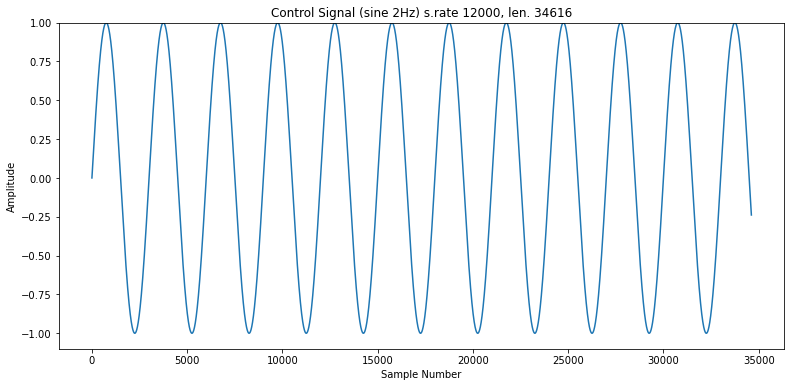

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:43: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:52: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


'Read file: RawSamplesSUpplied.noFile 34616 samples, rate 12000'

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:106: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


'Result of filtering:'

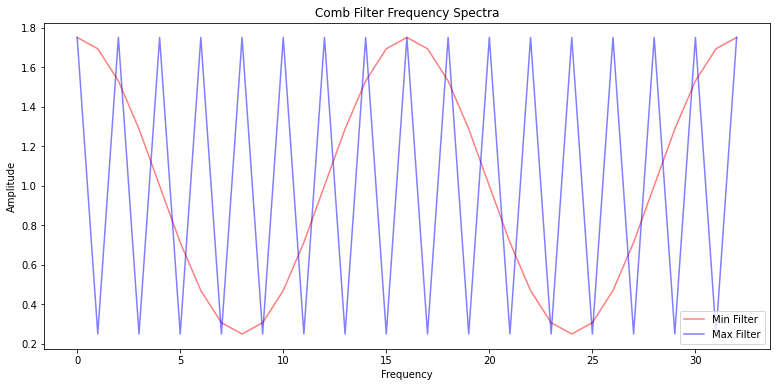

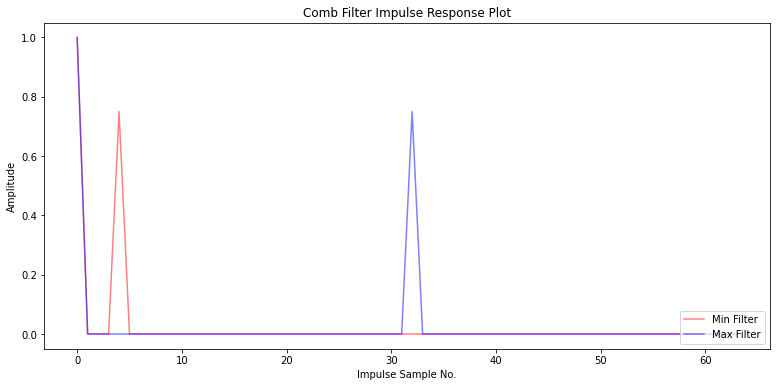

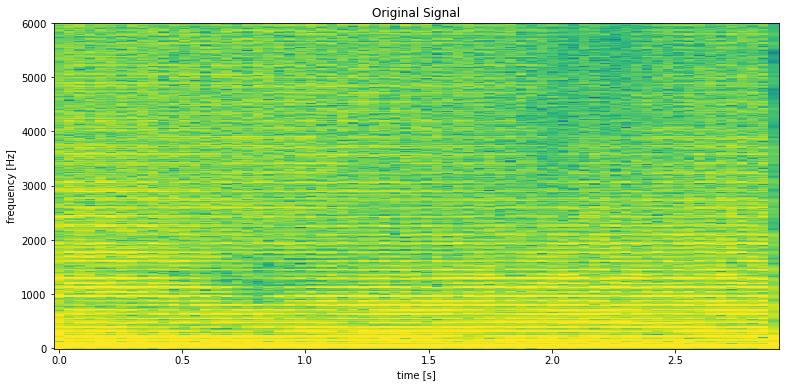

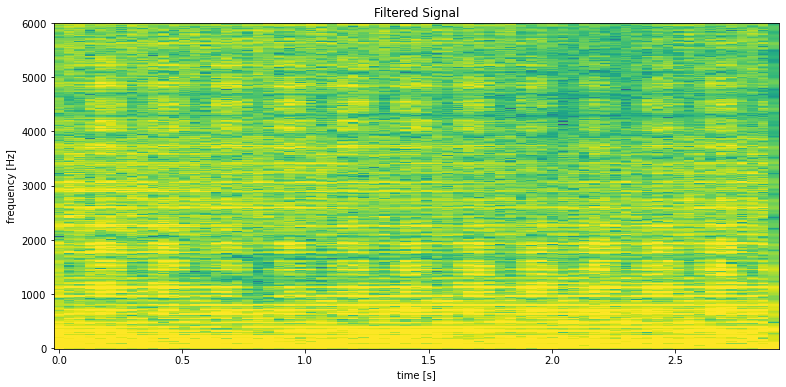

In [36]:
# load carrier.wav
wavClass = WavClass(wavFileName=s1Filename, doPlots=False)
# create the control (LFO) class
controlClass = ControlClass(wavClass.sampleRate, wavClass.numSamples, frequencyHz=2, maxAmplitude=1.0, doPlot=True)
# create the comb filter
filter = CombFilterClass(controlClass, minDelay=4, maxDelay=32, filterSize=64, doPlot=True)
# filter the signal
newSamples = filter.filterAudioInputSide(wavClass.samplesMono)
# display the result of the filter
newWavClass = WavClass(rawSamples=newSamples, rawSampleRate=wavClass.sampleRate)
#filter.plotOriginalAndConvolved(newSamples, wavClass.samplesMono, "Original and Filtered Signal")
filter.plot_spectrogram(wavClass.samplesMono, wavClass.sampleRate, "Original Signal")
filter.plot_spectrogram(newWavClass.samplesMono, newWavClass.sampleRate, "Filtered Signal")
display("Result of filtering:")
display(Audio(newWavClass.samples, rate=newWavClass.sampleRate))

#### Notes
Comparing the filtered signal to the original signal in the frquency domain, a pattern in the filtered signal is visible:
- The control frequency is 2 Hz, the plot shows the pattern happening two times per second.
- The comb filter is visible in the horizontal bands.
- The control modulation of the signal can be seen as alternating set of horizontal bands, oscillating between
  high and low amplitude values for each frequency band of the filter.

### Output Side Convolution on RockA.wav (converted to mono)

'Read file: audio/rockA.wav 545652 samples, rate 44100'

'Convert to mono: audio/rockA.wav'

'One channel needs inverting, the correlation coefficient is < 0'

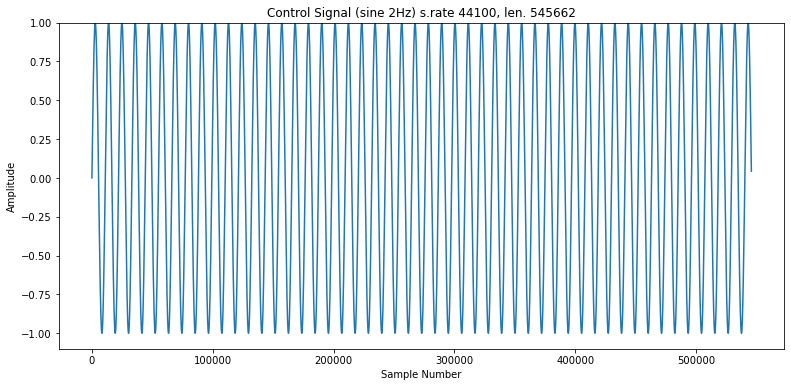

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:43: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:52: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


'Read file: RawSamplesSUpplied.noFile 545662 samples, rate 44100'

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:106: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


'Result of filtering:'

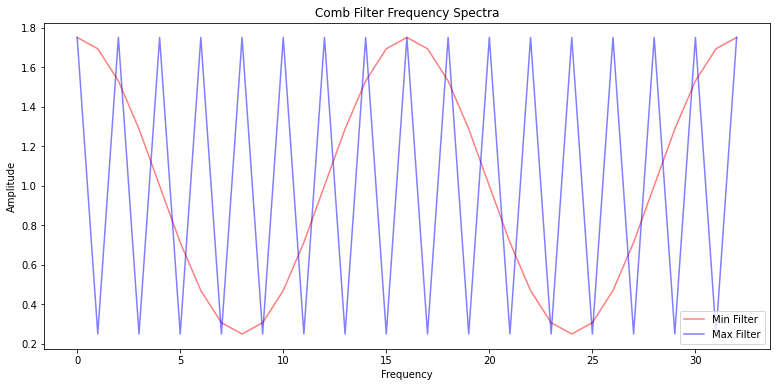

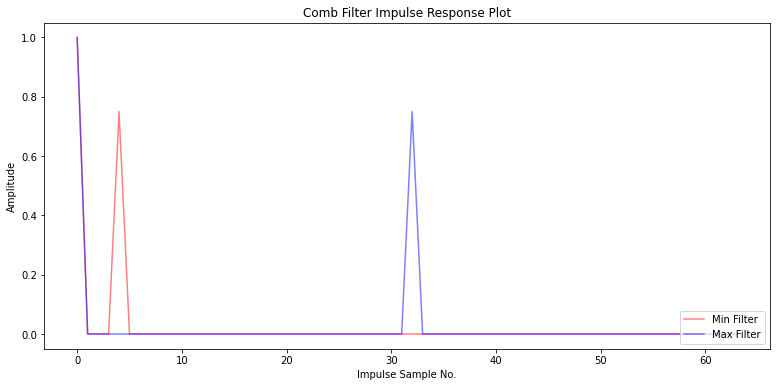

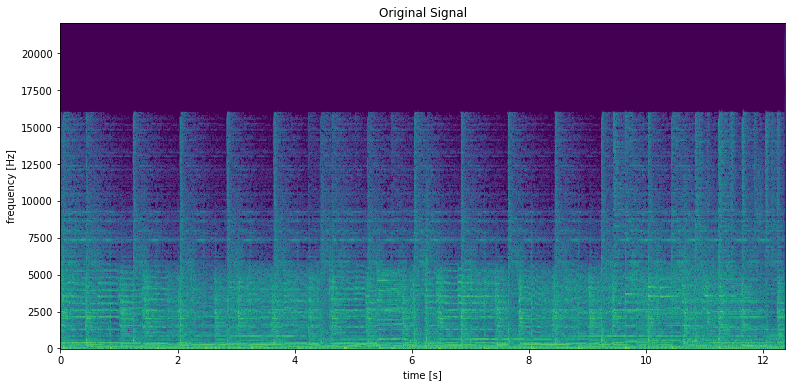

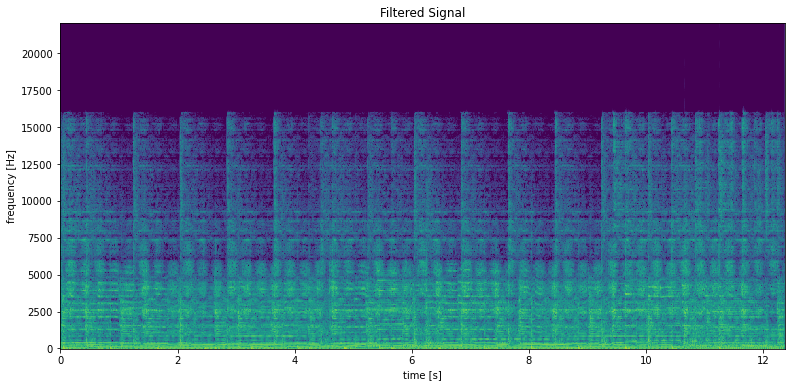

In [37]:
# load rockA.wav
wavClass = WavClass(wavFileName=s2Filename, doPlots=False)
# create the control (LFO) class
controlClass = ControlClass(wavClass.sampleRate, wavClass.numSamples, frequencyHz=2, maxAmplitude=1.0, doPlot=True)
# create the comb filter
filter = CombFilterClass(controlClass, minDelay=4, maxDelay=32, filterSize=64, doPlot=True)
# filter the signal
newSamples = filter.filterAudioInputSide(wavClass.samplesMono)
# display the result of the filter
newWavClass = WavClass(rawSamples=newSamples, rawSampleRate=wavClass.sampleRate)
filter.plot_spectrogram(wavClass.samplesMono, wavClass.sampleRate, "Original Signal")
filter.plot_spectrogram(newWavClass.samplesMono, newWavClass.sampleRate, "Filtered Signal")
display("Result of filtering:")
display(Audio(newWavClass.samples, rate=newWavClass.sampleRate))

#### Notes
The filtered signal's frequency response shows the effect of oscillating filter on the signal.
- The input signal is converted to mono: the phase is adjusted to avoid the channels cancelling each other out.
- The control filter is adjusted to match the input's sample rate, by generating a 2 Hz modulation for the given sample rate.
- The resulting filtered signal displays it pattern in the frequency spectrum, and the effect can be heard using the player.

### Output Side Convolution on RockB.wav (converted to mono)

'Read file: audio/rockB.wav 545652 samples, rate 44100'

'Convert to mono: audio/rockB.wav'

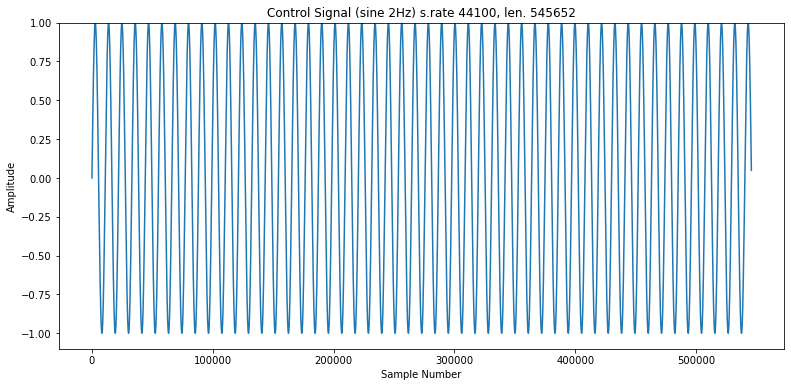

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:43: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:52: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


'Read file: RawSamplesSUpplied.noFile 545652 samples, rate 44100'

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:106: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


'Result of filtering:'

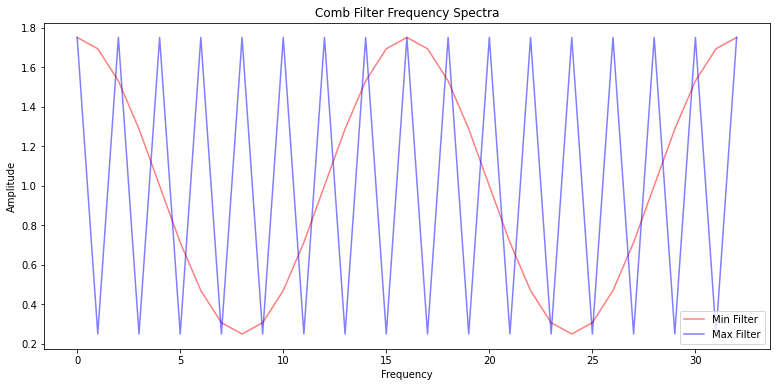

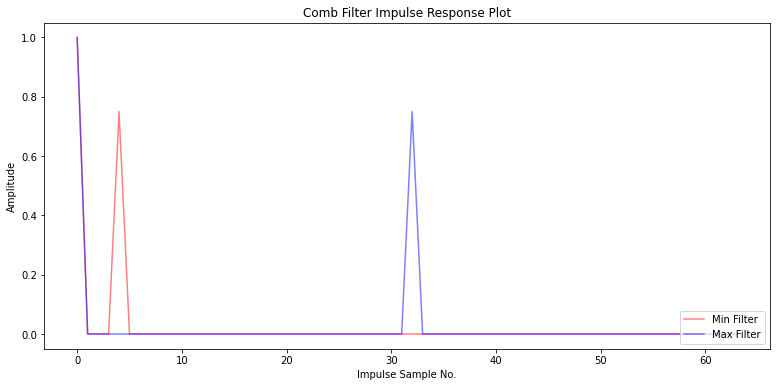

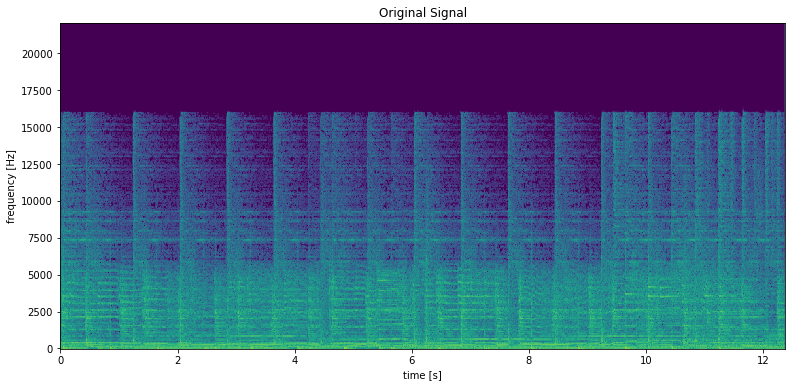

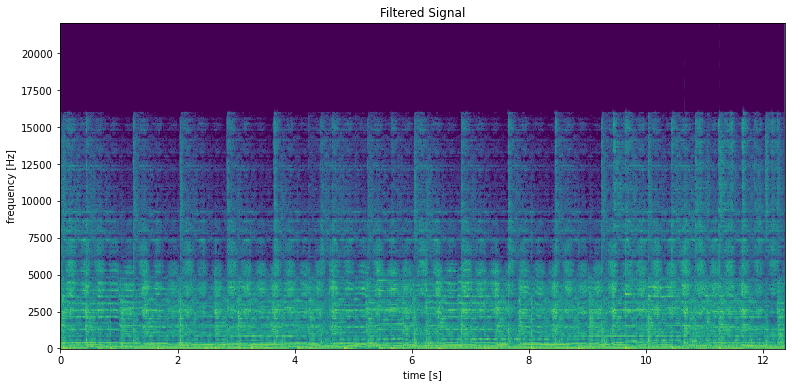

In [38]:
# load rockB.wav
wavClass = WavClass(wavFileName=s3Filename, doPlots=False)
# create the control (LFO) class
controlClass = ControlClass(wavClass.sampleRate, wavClass.numSamples, frequencyHz=2, maxAmplitude=1.0, doPlot=True)
# create the comb filter
filter = CombFilterClass(controlClass, minDelay=4, maxDelay=32, filterSize=64, doPlot=True)
# filter the signal
newSamples = filter.filterAudioInputSide(wavClass.samplesMono)
# display the result of the filter
newWavClass = WavClass(rawSamples=newSamples, rawSampleRate=wavClass.sampleRate)
filter.plot_spectrogram(wavClass.samplesMono, wavClass.sampleRate, "Original Signal")
filter.plot_spectrogram(newWavClass.samplesMono, newWavClass.sampleRate, "Filtered Signal")
display("Result of filtering:")
display(Audio(newWavClass.samples, rate=newWavClass.sampleRate))

####Notes
The filtered signal's frequency response shows the effect of oscillating filter on the signal.
- The input signal is converted to mono: the channels are in phase and so there is no adjustment made in the conversion to mono.
- The control filter is adjusted to match the input's sample rate, by generating a 2 Hz modulation for the given sample rate.
- The resulting filtered signal displays it pattern in the frequency spectrum, and the effect can be heard using the player.

## Digit recognition (UG & PG)

In this part, you're going to use images of handwritten digits ranging from 0 to 9. They are split in a training set and a test set and stored as text files in `data/digits-training.txt` and `data/digits-test.txt`.

In [1]:
# Repeat initialisations to allow running from this section
import sys
import datetime as dt;
import scipy.signal as sig
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Audio
from scipy import fft
plt.rcParams['figure.figsize'] = (13,6) # increase the default size of the plots

# display python version and date/time

print(dt.datetime.today());
print(sys.version)

# google colab specific code
if 'google.colab' in sys.modules:
    %ls data/digits-*.txt
else:
    %ls data

2021-04-16 09:09:52.715732
3.7.9 (default, Aug 31 2020, 17:10:11) [MSC v.1916 64 bit (AMD64)]
 Volume in drive C is OS
 Volume Serial Number is F287-2376

 Directory of C:\Users\jacqu\city\DS2020\Modules\DigitalSignalProcessing\Coursework\CourseworkWip\data

14/04/2021  10:41    <DIR>          .
14/04/2021  10:41    <DIR>          ..
13/02/2021  11:45         1,934,417 digits-test.txt
13/02/2021  11:45         3,966,946 digits-training.txt
13/02/2021  11:45         1,048,736 energy_usage.pkl
13/02/2021  11:45           119,126 financial_data.csv
13/02/2021  16:30    <DIR>          images
13/02/2021  11:45        15,604,951 power_consumption.csv
14/04/2021  10:34               519 shampoo.csv
               6 File(s)     22,674,695 bytes
               3 Dir(s)  60,111,523,840 bytes free


### ImageClass
A class is implemented to wrap the folowwing:
- load images from the custom format: the provided loader function `read_digit_pixels_and_labels`
  is refactored as 'readImages' in the class.
- a copy method is provided
- methods to plot the images are present
- methods to process the images: rotate, offset, add noise, and convert to negative representations

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display
import skimage.transform as imgTransform
import skimage.util as imgUtil
from itertools import islice
import re
import math
from scipy import stats

class ImageClass:
    #
    # Class to encapsulate a set of images: loads a set of digit images and their labels
    # self.digitPixels[] holds all the images, each one a 32x32 pixel array
    # self.digitLabels[] holds the digit labels that correspond to the images
    #

    # constructor
    def __init__(self):
        print("Image class init")

    # create a deep copy of this instance
    # startIndex, endIndex, optional subset of images to copy to the new ImageClass instance, all are copied by default
    # return the new copy of ImageClass
    def copy(self, startIndex=0, endIndex=-1):
        copy = ImageClass()
        copy.digitPixels = self.digitPixels.copy()
        copy.digitLabels = self.digitLabels.copy()
        if startIndex != 0 or endIndex != -1:
            copy.digitPixels = copy.digitPixels[startIndex:endIndex]
            copy.digitLabels = copy.digitLabels[startIndex:endIndex]
        return copy

    # Code refactored from the coursework's read_digit_pixels_and_labels() function
    # load all the images in the given file
    # sets self.digitPixels[] and self.digitLabels[] to the image data and labels
    # stores the images in self.digitPixels and labels in self.digitLabels
    #
    # filename: the file that holds the images and labels to read.
    def readImages(self, filename):
        with open(filename) as f:
            header = list(islice(f, 21))
            pixel_height = [int(x[1]) for x in map(lambda r: re.match('entheight = (\d+)', r), header) if x][0]
            num_digits = [int(x[1]) for x in map(lambda r: re.match('ntot = (\d+)', r), header) if x][0]
            self.digitPixels = []
            self.digitLabels = []
            for _ in range(num_digits):
                chunk = list(islice(f, pixel_height + 1))
                self.digitPixels.append(np.loadtxt(chunk[:-1]))
                self.digitLabels.append(int(chunk[-1]))

            display("Loaded {} images and {} labels.".format(len(self.digitPixels), len(self.digitLabels)))

    #
    # display the requested image
    # imageIndex the index of the image in the digiPixels images array
    def displayImage(self,imageIndex):
        plt.figure()
        plt.imshow(self.digitPixels[imageIndex])
        plt.show()
        print('Image of digit {}'.format(self.digitLabels[imageIndex]))

    # displays images, 4 to a row.
    # imageIndeces an optional set of image indeces to display: default is ALL images
    def displayImages(self, imageIndeces=None):
        if imageIndeces == None:
            imageIndeces = range(0, len(self.digitPixels))
        columns = 4
        rows = int(len(imageIndeces) / 4) + int(len(imageIndeces) % 4)
        fig = plt.figure()
        fig.subplots_adjust(hspace=0.6)
        for imageIndex in range(1, len(imageIndeces)):
            ax = fig.add_subplot(rows, columns, imageIndex)
            ax.imshow(self.digitPixels[imageIndex])
            ax.title.set_text("Label {}".format(self.digitLabels[imageIndex]))
            ax.set(yticklabels=[])
            ax.set(xticklabels=[])
        plt.show()

    def displayLabelsStatitics(self, title):
        modeResult = stats.mode(self.digitLabels)[0][0]
        print(title)
        print("\tMean: {:.4f} Variance: {:.4f} Std Dev: {:.4f}\n\tMode: {:.4f} Median: {:.4f} Skewness: {:.4f}".format(
            np.mean(self.digitLabels), np.var(self.digitLabels), math.sqrt(np.var(self.digitLabels)),
            stats.mode(self.digitLabels)[0][0], np.median(self.digitLabels),
            stats.skew(self.digitLabels)))
        labelCount = np.bincount(self.digitLabels)/len(self.digitLabels)
        print("\tLabel distribution of each value: 0: {:.2f}, 1: {:.2f}, 2: {:.2f}, 3: {:.2f}, 4: {:.2f}, 5: {:.2f}, 6: {:.2f}, 7: {:.2f}, 8: {:.2f}, 9: {:.2f}".format(
            labelCount[0],
            labelCount[1],
            labelCount[2],
            labelCount[3],
            labelCount[4],
            labelCount[5],
            labelCount[6],
            labelCount[7],
            labelCount[8],
            labelCount[9]))

    # converts this class' images to negatives of the images
    # returns an instance of this class, as a convenience
    def convertImagesToNegativeImages(self):
        negatives = []
        for originalImage in self.digitPixels:
            negatives.append((originalImage - 1) * -1)
        self.digitPixels = negatives
        return self

    # rotates this class' images anticlockwise by the number of degrees requested
    # angle the number of degrees to rotate the image
    # returns an instance of this class, as a convenience
    def rotateImages(self, angle):
        rotated = []
        for originalImage in self.digitPixels:
            rotated.append(imgTransform.rotate(originalImage, angle, resize=False, center=None))
        self.digitPixels =  rotated
        return self

    # adds noise to all of this class' images
    # randomSeed the random number generator seed to use (default is 101)
    # returns an instance of this class, as a convenience
    def addNoiseToImages(self, randomSeed = 101):
        noisy = []
        for originalImage in self.digitPixels:
            noisy.append(imgUtil.random_noise(originalImage, mode='s&p', seed=randomSeed))
        self.digitPixels = noisy
        return self

    # shift all the images by x and y pixels
    # returns an instance of this class, as a convenience
    def offSetImages(self, xOffset, yOffset):
        offsetImages = []

        for originalImage in self.digitPixels:
            if yOffset > 0:
                originalImage = np.pad(originalImage, [(yOffset, 0), (0, 0)], 'constant', constant_values=(0))
                originalImage = originalImage[:-yOffset,:]
            if xOffset > 0:
                originalImage = np.pad(originalImage, [(0, 0), (xOffset, 0)], 'constant', constant_values=(0))
                originalImage = originalImage[:, :-xOffset]
            offsetImages.append(originalImage)
        self.digitPixels = offsetImages
        return self


load the training images

Image class init


'Loaded 1934 images and 1934 labels.'

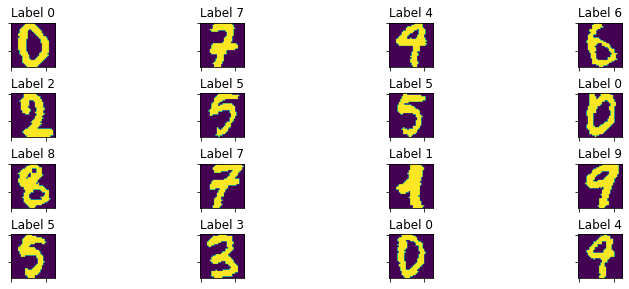

Training labels statsitics
	Mean: 4.5072 Variance: 8.2954 Std Dev: 2.8802
	Mode: 9.0000 Median: 4.5000 Skewness: 0.0071
	Label distribution of each value: 0: 0.10, 1: 0.10, 2: 0.10, 3: 0.10, 4: 0.10, 5: 0.10, 6: 0.10, 7: 0.10, 8: 0.09, 9: 0.11


In [11]:
trainImages = ImageClass()
trainImages.readImages('data/digits-training.txt')
# display the 1st 16 images
trainImages.displayImages(range(0, 17))
trainImages.displayLabelsStatitics("Training labels statsitics")

#### Notes
- The images are 32x32 pixels each, black/white (a pixel value of 0 = dark, 1 = bright)
- The arrangement of the images in the files is random.
- The dataset is reasonably balanced.

load the test images

Image class init


'Loaded 943 images and 943 labels.'

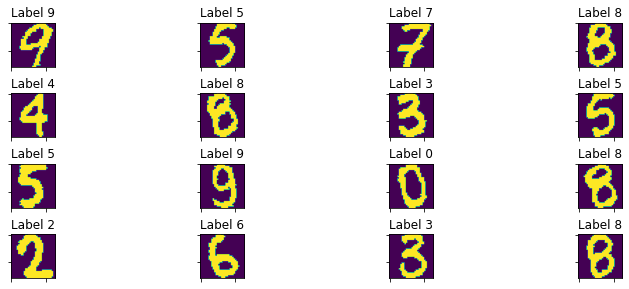

Test labels statsitics
	Mean: 4.5072 Variance: 8.2954 Std Dev: 2.8802
	Mode: 9.0000 Median: 4.5000 Skewness: 0.0071
	Label distribution of each value: 0: 0.10, 1: 0.10, 2: 0.10, 3: 0.10, 4: 0.10, 5: 0.10, 6: 0.10, 7: 0.10, 8: 0.09, 9: 0.11


In [12]:
testImages = ImageClass()
testImages.readImages('data/digits-test.txt')
# display the 1st 16 images
testImages.displayImages(range(0, 17))
trainImages.displayLabelsStatitics("Test labels statsitics")

#### Notes
- The images are 32x32 pixels each, black/white (a pixel value of 0 = dark, 1 = bright)
- The arrangement of the images in the files is random.
- The dataset is reasonably balanced.

#### Correlation tasks
Using this data, your task is to:

1. Create a function for comparing each test image with the collection of training images, using the correlation with each training image without offset (i.e. calculate the sum of the element-wise multiplied images).
2. Estimate the most likely label for each test image by matching with the training image that has maximal correlation.
3. Estimate the accuracy of your system, as a fraction of the correctly estimated test labels over the total number of test images.
4. Use the two-dimensional correlation function [`signal.correlate2d`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.correlate2d.html) to find the best match over all image offsets. For efficiency you can use a subset of the training images, or calculate an average of the training images.
5. Implement variants of the digit recognition system, e.g.
    - use the negatives of the training and test images instead of the positive images
    - use images that are slightly rotated in your training set (using [`rotate`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.rotate) from the `scikit-image.transform` library)
    - use images with some noise added in your training set (using [`random_noise`](https://scikit-image.org/docs/dev/api/skimage.util.html#random-noise) from the `scikit-image.util` library)
6. Report the accuracy of the new system and compare with the accuracy of the previous systems.
7. In the written report, discuss and reason about the different performances of your classifiers.

#### class ImageCorrelation
A class is implemented to perform tasks 1 to 6:

In [10]:
class ImageCorrelation:
    #
    # Class that encapsulates the image correlation functionality: 2 correlation versions are available:
    # one is using a simple correlation implementation (correlate()), the other uses signal.correlate2d()
    #
    def __init__(self):
        print("ImageCorrelation init")
    #
    # 1. 1.	Create a function for comparing each test image with the collection of training images, using the correlation
    # with each training image without offset (i.e. calculate the sum of the element-wise multiplied images).
    #
    #  pixels1, pixels2 images pixel arrays to correlate
    # return correlation value
    def correlate(self, pixels1, pixels2):
        # the two images are the same size so the size of one is used
        # to iterate over each pixel of both images
        imageShape = pixels1.shape
        correlation = 0
        for y in range(0, imageShape[0]):
            for x in range(0, imageShape[1]):
                correlation = correlation + (pixels1[y,x] * pixels2[y,x])
        return correlation

    #
    # 2. Estimate the most likely label for each test image by matching with the training image that has maximal correlation.
    # correlate all images in imagesArray to the singleImage.
    # return the index (in imagesArray) of the image which has the
    # largest correlation value
    #
    # singleTrainingDigitPixels training image pixels array
    # testDigitsPixels array of test images pixels array to correlate against
    # return the testImagesArray index of the best match found
    def correlateImagesToSingleImage(self, singleTrainingDigitPixels, testDigitsPixels):
        correlation = []
        # for each test image
        for imageIndex in range(0, len(testDigitsPixels)):
            # calculate the correlation with the singleTrainingImage and save it in correlation[]
            correlation.append(self.correlate(singleTrainingDigitPixels, testDigitsPixels[imageIndex]))
        # find the maximum correlation
        maxCorrelation = max(correlation)
        # using the max correlation value, find the index of it in correlation[]
        maxCorrelationImageIndex = correlation.index(maxCorrelation)
        return maxCorrelationImageIndex


    #
    # correlate using the correlation method in this class all training images with all test images
    #
    # trainingImages class instance with the relevant training images to correlate (in digiPixels)
    # testImages class instance with all the test images
    # return array of best matches as indeces into the test images for each of the training images
    def correlateTrainingImagesToTestImages(self, trainingImages, testImages):
        #print("correlateTrainingImagesToTestImages({}, {})".format(len(trainingImages), len(testImages)))
        image2CorrelationIndeces = []
        # for each training image
        for imageIndex in range(0, len(trainingImages.digitPixels)):
            # find the best match in the test images using correlate(), store the result in image2CorrelationIndeces
            image2CorrelationIndeces.append(
                self.correlateImagesToSingleImage(trainingImages.digitPixels[imageIndex], testImages.digitPixels))
        # return array of best match found in testImages, one perTrainingImages[] entry
        return image2CorrelationIndeces

    # 3. Estimate the accuracy of your system, as a fraction of the correctly estimated test labels over the total
    # number of test images.
    #
    # trainToTestCorrelationIndeces an indeces array of training predictions: each entry contains the index of the
    #                       predicted label in testLabels
    # trainingImages class instance that has an array of the training image labels
    # testImages class instance that has an array of the test labels
    # returns overall accuracy as correctly estimated count / the number of  entries in trainToTestCorrelationIndeces
    def calculateCorrelationAccuracy(self, trainToTestCorrelationIndeces, trainingImages, testImages):
        trainingLabels = trainingImages.digitLabels
        testLabels = testImages.digitLabels
        correctlyEstimatedCount = 0
        ' for each predicted result, count the number of correct matches'
        for labelsIndex in range(0, len(trainToTestCorrelationIndeces)  ):
            testLabelsIndex = trainToTestCorrelationIndeces[labelsIndex]
            if trainingLabels[labelsIndex] == testLabels[testLabelsIndex]:
                correctlyEstimatedCount =  correctlyEstimatedCount + 1
        # return the number of correctly matched training images / the total number of the training images
        return correctlyEstimatedCount / len(trainingLabels)

    #
    # Find the best 2d correlation between the singleTestImage and all the testImages,
    # Use the two-dimensional correlation function signal.correlate2d to find the best match over
    # all image offsets.
    #
    # singleTrainingDigitPixels a single training image digitPixels array
    # testDigitsPixels an array of all the test images digitPixels, each one a 32x32 array
    # return the testImagesArray index with the best correlation
    def calculate2dCorrelation(self, singleTrainingDigitPixels, testDigitsPixels):
        # where each correlation value for each test image is stored, hence the indeces of the correlation values
        # can be used as a key to get the matching test image
        correlations = []
        # for each test image
        for imageIndex in range(0, len(testDigitsPixels)):
            currentTestDigitPixels = testDigitsPixels[imageIndex]
            # correlate test image with training image
            result = sig.correlate2d(singleTrainingDigitPixels, currentTestDigitPixels, mode='same')
            # extract and store in correlations the largest correlation value found
            bestCorrelation = np.amax(result)
            correlations.append(bestCorrelation)
        # find the maximum correlation value
        maxOverallCorrelation = max(correlations)
        # find the index of the max correlation, the index is also valid for the testImages
        maxCorrelationImageIndex = correlations.index(maxOverallCorrelation)
        return maxCorrelationImageIndex

    # Find the best 2d correlation between the singleTestImage and all the testImages,
    # For efficiency you can use a subset of the training images
    #
    # trainingImages training images class instance that holds the relevant training images
    # testImages test image class instance that holds all the test images
    # return the testImagesArray indeces (one per training image) with the best correlation
    def correlate2dTrainingImagesToTestImages(self, trainingImages, testImages):
        image2CorrelationIndeces = []
        # fro each training image
        for imageIndex in range(0, len(trainingImages.digitPixels)):
            # evaluate it best 2d correlation with the test images
            image2CorrelationIndeces.append(
                self.calculate2dCorrelation(trainingImages.digitPixels[imageIndex], testImages.digitPixels))

        return image2CorrelationIndeces

    # perform simple correlation and 2d correlation of the training images against the test images
    # returns 2 values: the overall simple correlation accuracy and the overall 2d correlation accuracy
    def compareImageCorrelations(self, trainingImages, testImages):
        simpleCorrelationIndeces = self.correlateTrainingImagesToTestImages(trainingImages, testImages)
        c2dCorrelationIndeces = self.correlate2dTrainingImagesToTestImages(trainingImages, testImages)
        simpleCorrelationAccuracy = self.calculateCorrelationAccuracy(simpleCorrelationIndeces, trainingImages, testImages)
        c2dCorrelationAccuracy = self.calculateCorrelationAccuracy(c2dCorrelationIndeces, trainingImages, testImages)
        return simpleCorrelationAccuracy, c2dCorrelationAccuracy

#### Correlation of each training image to each test image
1. Create a function for comparing each test image with the collection of training images, using the correlation
   with each training image without offset (i.e. calculate the sum of the element-wise multiplied images).
2. Estimate the most likely label for each test image by matching with the training image that has maximal correlation.
3. Estimate the accuracy of your system, as a fraction of the correctly estimated test labels over the total number of test images.

In [14]:
# create an image correlation class
imageCorrelation = ImageCorrelation()
# calculate correlation of training images to test images, into an array, one entry per trainImage, set to the index best match found
# in the testImages
bestMatchTestImageIndeces = imageCorrelation.correlateTrainingImagesToTestImages(trainImages, testImages)
# calculate overall accuracy
overallCorrelationAccuracy = imageCorrelation.calculateCorrelationAccuracy(bestMatchTestImageIndeces, trainImages, testImages)
print("Overall correlation accuracy: ", overallCorrelationAccuracy)

ImageCorrelation init
Overall correlation accuracy:  0.8479834539813857


The overall correlation accuracy using the method written for tasks 1-3 is noted as 0.8480.

##### Use the two-dimensional correlation function
   [`signal.correlate2d`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.correlate2d.html)
   to find the best match over all image offsets. For efficiency you can use a subset of the training images,
   or calculate an average of the training images.

A subset of the training images (100 images, at positions 300 to 400 this time) is used to correlate the training images against signal.correlate2d, over
all image offsets. The original correlation task is also performed in the same subset, so that a fair comparison can be achieved.

In [15]:
# create a subset of the training images by copying images at index 300 to 400 inclusive:
trainImageSubset = trainImages.copy(300,400)
print("Training image subset of {} images created.".format(len(trainImageSubset.digitPixels)))

# get the best match for each training subset image using 2d correlation
bestMatchTestImageIndeces = imageCorrelation.correlate2dTrainingImagesToTestImages(trainImageSubset, testImages)
# calculate overall accuracy
overallCorrelationAccuracy = imageCorrelation.calculateCorrelationAccuracy(bestMatchTestImageIndeces, trainImageSubset, testImages)
print("Overall correlation 2d accuracy: ", overallCorrelationAccuracy)

# get the best match for each training subset image using simple correlation
bestMatchTestImageIndeces = imageCorrelation.correlateTrainingImagesToTestImages(trainImageSubset, testImages)
# calculate overall accuracy
overallCorrelationAccuracy = imageCorrelation.calculateCorrelationAccuracy(bestMatchTestImageIndeces, trainImageSubset, testImages)
print("Overall simple correlation accuracy: ", overallCorrelationAccuracy)

Image class init
Training image subset of 100 images created.
Overall correlation 2d accuracy:  0.67
Overall simple correlation accuracy:  0.62


The correlation is lower using the training subset for both correlations, slightly better for the 2d correlation.
#### Compare variants of the digit recognition system

5. Implement variants of the digit recognition system.

#### negatives of the training and test images instead of the positive images

Negative Images

Training Images
Image class init


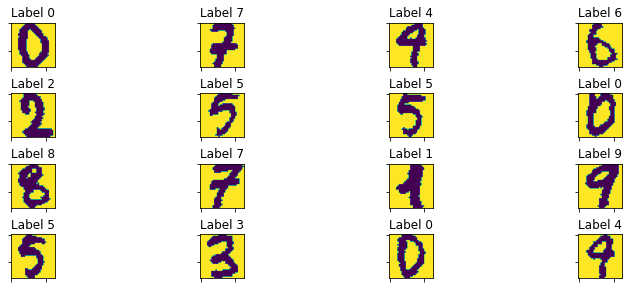

Test Images
Image class init


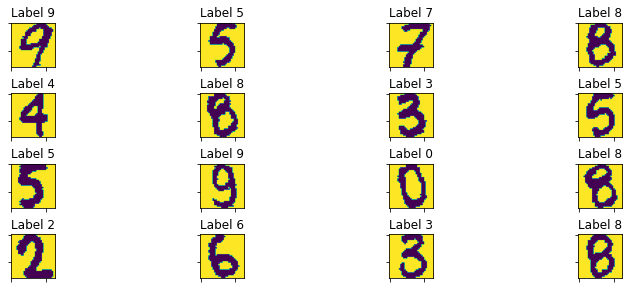

Accuracies: Corr: 0.93 2dCorr: 0.93


In [16]:
print("Negative Images\n")

# create negative version of a training image subset of 50 images
print("Training Images")
negTrain = trainImages.copy(0,100).convertImagesToNegativeImages()
negTrain.displayImages(range(0, 17))

print("Test Images")
# create a negative version of the test images
negTest =  testImages.copy().convertImagesToNegativeImages()
negTest.displayImages(range(0, 17))

# compare the simple correlation to the 2d correlation
simpleAccuracy, c2dAccuracy = imageCorrelation.compareImageCorrelations(negTrain, negTest)
print("Accuracies: Corr: {} 2dCorr: {}".format(simpleAccuracy, c2dAccuracy))

The result for the training subset 0 - 100 is the same for simple correlation and 2d correlation:

Correlating negatives has no effect on the algorithms, as expected.

#### compare training images, rotated by 15 degrees, to the test set (not rotated) images

Rotated Images

Image class init


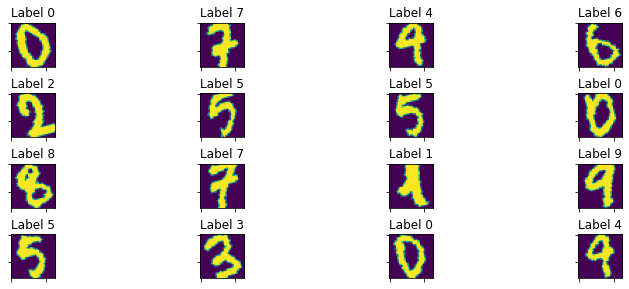

Accuracies: Corr: 0.68 2dCorr: 0.71


In [17]:
print("Rotated Images\n")

# create a rotated version of a training image subset of 50 images
rotTrain = trainImages.copy(0,100).rotateImages(15)
rotTrain.displayImages(range(0, 17))

# compare the simple correlation to the 2d correlation
simpleAccuracy, c2dAccuracy = imageCorrelation.compareImageCorrelations(rotTrain, testImages)
print("Accuracies: Corr: {} 2dCorr: {}".format(simpleAccuracy, c2dAccuracy))

The 2d correlation is slightly better than the simple correlation. This is because 2d correlation uses all image offsets.
#### compare training images, with random noise added, to the test set (no noise) images

Noisy Images

Image class init


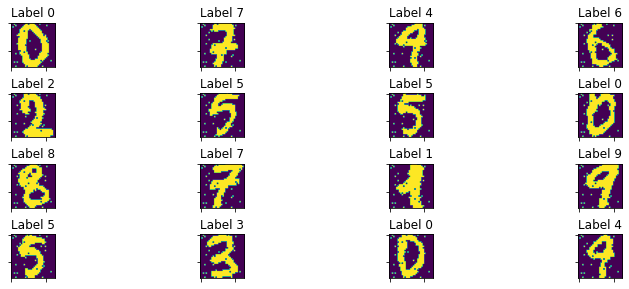

Accuracies: Corr: 0.89 2dCorr: 0.91


In [18]:
print("Noisy Images\n")

# create subset of noisy training images
noiseTrain = trainImages.copy(0, 100).addNoiseToImages(5)
noiseTrain.displayImages(range(0, 17))

# compare the simple correlation to the 2d correlation
simpleAccuracy, c2dAccuracy = imageCorrelation.compareImageCorrelations(noiseTrain, testImages)
print("Accuracies: Corr: {} 2dCorr: {}".format(simpleAccuracy, c2dAccuracy))

The 2d correlation is slightly better than the simple correlation.
#### compare training images, with offset added, to the test set (no offset added)

Offset Images

Image class init


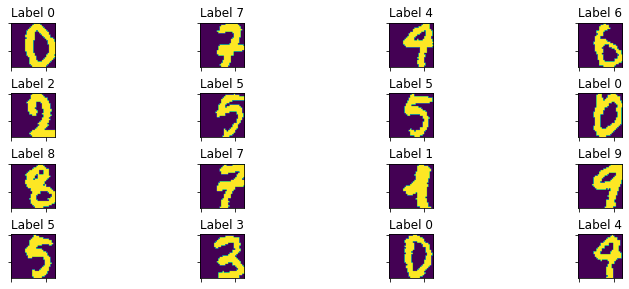

Accuracies: Corr: 0.27 2dCorr: 0.91


In [19]:
print("Offset Images\n")
# create subset of offset training images (shifted 5 pixels to the right, 1 pixel down)
offsetTrain = trainImages.copy(0, 100).offSetImages(5, 1)
offsetTrain.displayImages(range(0, 17))

# compare the simple correlation to the 2d correlation
simpleAccuracy, c2dAccuracy = imageCorrelation.compareImageCorrelations(offsetTrain, testImages)
print("Accuracies: Corr: {} 2dCorr: {}".format(simpleAccuracy, c2dAccuracy))

When the training images are offset, the difference in correlation is more noticeable: 2d correlation is much better at 0.91
versus 0.27 for simple correlation. This is because 2d correlation
attempts to find the best match over all image offsets, whereas the simple correlation is a comparison of the two images without offset.
#### compare training images, rotated by 15 degrees, with noise added, to the test set (no alterations done)

Rotated & Noise to training images

Image class init


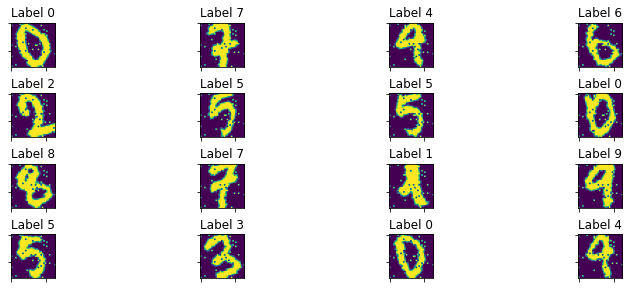

Accuracies: Corr: 0.66 2dCorr: 0.69


In [20]:
print("Rotated & Noise to training images\n")
# create subset of offset training images (shifted 5 pixels to the right, 1 pixel down)
rotNoiseTrain = trainImages.copy(0, 100).rotateImages(15).addNoiseToImages(10)
rotNoiseTrain.displayImages(range(0, 17))

# compare the simple correlation to the 2d correlation
simpleAccuracy, c2dAccuracy = imageCorrelation.compareImageCorrelations(rotNoiseTrain, testImages)
print("Accuracies: Corr: {} 2dCorr: {}".format(simpleAccuracy, c2dAccuracy))

Combining the rotation and noise gives an accuracy difference of 0.3, the same as for rotation alone. The overall
accuracy values are lower than rotation alone. So combining both noise and rotation has had an additive impact on the
overall accuracies.
## Time series prediction with financial data (UG pairs & PG)

In this part, you're going to use long term US stock market data (monthly indices, dividends, earnings, etc. since 1871). Information about the data provenance and references can be found at http://www.econ.yale.edu/~shiller/data.htm (especially the 2nd paragraph). The data is available in the file `data/financial_data.csv`.

It is stored as comma-separated numerical values, with a header containing column names. Therefore we can use [`np.genfromtxt`](https://docs.scipy.org/doc/numpy/reference/generated/numpy.genfromtxt.html#numpy.genfromtxt) to read it.

In [ ]:
financial = np.genfromtxt('data/financial_data.csv', delimiter=',', skip_header=2, names=True)

The result is a structured array, which means that we can access each of the columns in the table by its name. The list of all colums can be found below.

In [ ]:
financial.dtype.names

You can access the columns using their names between square brackets, like you would for a dictionary. It's advised to store the columns you need in helper variables, to avoid long statements resulting from the long column names.

In [ ]:
date = financial['Date']
real_price = financial['Real_Price']

Now you can easily use the data, for instance to plot it.

In [ ]:
plt.figure()
plt.plot(date, real_price)
plt.title('Evolution of Real Price over time')
plt.show()

Using this data, your task is to:

1. Look for long term trends on a linear and log scale and de-trend the data first.
2. Calculate the FFT of the signal of interest, to estimate possible periodicities. You can use a window to avoid spectral leaking.
3. Refine your analysis by adjusting the size of the dataset (e.g. if you model annual patterns, make sure your dataset size is a multiple of 12).

#### A class is implemented to wrap the data: load, plot, look for trends and de-trend

In [24]:
import math
import matplotlib.pyplot as plt
import numpy as np
import warnings
import scipy.signal as sig
from scipy import stats
warnings.simplefilter('ignore', np.RankWarning)

plt.rcParams['figure.figsize'] = (16,20) # increase the default size of the plots

class FinancialDataClass2:
    #
    # Class wraps the financial data file as a class, provides convenience methods to access the data, removes nan's,
    # provides plotting methods.


    # constructor: load the csv file, clean out nan's, replacing some with max values, others with a specified
    # value: Cyclically_Adjusted_Price_Earnings_Ratio_PE10_or_CAPE's nan's are set to 13, after inspecting the the data,
    # 13 is a good value for the adjusted PE ratio.
    # sets self.financial to the data read
    def __init__(self, dataFile):
        self.financial = np.genfromtxt(dataFile, delimiter=',', skip_header=2, names=True)
        #'Date',
        #'SP_Comp_P',
        #'Dividend_D',
        self.replaceColumnNansWithMax('Dividend_D')
        #'Earnings_E',
        self.replaceColumnNansWithMax('Earnings_E')
        #'Consumer_Price_Index_CPI',
        # 'Date_Fraction',
        # 'Long_Interest_Rate_GS10',
        # 'Real_Price',
        # 'Real_Dividend',
        self.replaceColumnNansWithMax('Real_Dividend')
        # 'Real_Earnings',
        self.replaceColumnNansWithMax('Real_Earnings')
        # 'Cyclically_Adjusted_Price_Earnings_Ratio_PE10_or_CAPE'
        self.replaceColumnNansWithValue('Cyclically_Adjusted_Price_Earnings_Ratio_PE10_or_CAPE', 13.0)
        self.normaliseByColumn()


    #
    # replaces nan values in the data column with the given value
    # columnName: the name of the column to process
    # value: the value that replaces the nan's
    def replaceColumnNansWithValue(self, columnName, value):
        dataColumn = self.financial[columnName]
        copy = np.nan_to_num(dataColumn, copy=False, nan=value)
        self.financial[columnName] = copy

    #
    # replaces nan values in the data column with the column's maximum value
    # columnName: the name of the column to process
    def replaceColumnNansWithMax(self, columnName):
        dataColumn = self.financial[columnName]
        copy = np.nan_to_num(dataColumn, copy=True, nan=0)
        maxValue = np.max(copy)
        self.financial[columnName] = np.nan_to_num(dataColumn, copy=False, nan=maxValue)

    # Display statsitical information for each column (the Date column is left out)
    def displayDataSummary(self):
        print(self.financial.dtype.names)
        print("There are {} daily records in the file.".format(self.financial.size))
        columnNames = self.financial.dtype.names
        # don't normalise the date column:
        dataColumnIndeces = range(1, len(columnNames))
        print("The file contains values that are read every month, {} months of data is {:.2f} years".format(self.financial.size, self.financial.size/12))
        for columnIndex in dataColumnIndeces:
            data = self.financial[columnNames[columnIndex]]
            normalized = self.normalize(data)
            self.financial[columnNames[columnIndex]] = normalized
            print(self.getColumnName(columnIndex))
            print("\tMean: {:.4f} Variance: {:.4f} Std Dev: {:.4f}\n\tMode: {:.4f} Median: {:.4f} Skewness: {:.4f}".format(
                np.mean(data), np.var(data), math.sqrt(np.var(data)), stats.mode(data)[0][0], np.median(data), stats.skew(data)))

    # get all the data for the requested column
    # columnNameOrIndex the column's name or index
    # return an array of the column data
    def getColumnData(self, columnNameOrIndex):
        if isinstance(columnNameOrIndex, str):
            return self.financial[columnNameOrIndex]
        columnNames = self.financial.dtype.names
        return self.getColumnData(columnNames[columnNameOrIndex])

    # get the name of the requested column's index
    # columnIndex the column's index
    # return the name of the column
    def getColumnName(self, columnIndex):
        return self.financial.dtype.names[columnIndex]

    # get a range array 0 .. the number of columns
    # columnIndex the column's index
    # return the name of the column
    def getColumnIndeces(self):
        return range(0, len(self.financial.dtype.names))

    # get the number of months the data spans
    # return the number of data rows (months)
    def getTotalMonthsInData(self):
        return len(self.getColumnData("Date"))

    # normalise the ALL columns' data (Date omitted), by column
    def normaliseByColumn(self):
        columnNames = self.financial.dtype.names
        # don't normalise the date column:
        dataColumnIndeces = range(1, len(columnNames))
        for columnIndex in dataColumnIndeces:
            data = self.financial[columnNames[columnIndex]]
            normalized = self.normalize(data)
            self.financial[columnNames[columnIndex]] = normalized

    # evaluate the normalisation of an array of data
    # data to normalise
    # return normalised data
    def normalize(self, data):
        min = np.min(data)
        max = np.max(data)
        euclidianLength = math.sqrt((min ** 2) + (max ** 2))
        data = data / euclidianLength
        return data

    # Similar to calling fig.lengend(), then fig.show():
    # Loops through the repeated labels created to extract the first set.
    # Sets the legend on the figure, so for subplots, only one legend is shown.
    # found on:
    # https://www.geeksforgeeks.org/how-to-create-a-single-legend-for-all-subplots-in-matplotlib/
    # then customised for this task, expects the current figure to be called "MainFigure"
    #
    # loc: location of the legend
    def displayLegendsAndShow(self, loc='upper left'):
        lines = []
        labels = []

        fig = plt.figure("MainFigure")
        addedLabels = set()
        for ax in fig.axes:
            axlines, axlabels = ax.get_legend_handles_labels()
            # print(Label)
            doBreak = False
            for axlabel in axlabels:
                if axlabel in addedLabels:
                    # label with the same name already added,
                    # we don't want to repeat
                    # subplot labels
                    doBreak = True
                    break
                addedLabels.add(axlabel)
            if doBreak:
                break
            lines.extend(axlines)
            labels.extend(axlabels)
            addedLabels.add(axlabel)
        fig.legend(lines, labels, loc=loc)
        plt.show()

    # calculate a log10 version of the column data
    # columnNameOrData the column used in the calculation, or the actual data to use
    # log10 of the data
    def getLog10ColumnData(self, columnNameOrData):
        if isinstance(columnNameOrData, str):
            columnData = self.financial[columnNameOrData]
        else:
            columnData = columnNameOrData
        # adding a small number before applying log10 avoids divide by zero errors
        columnFiltered = np.log10(columnData +  np.finfo(float).eps)
        return columnFiltered

    # Plot the log10 of a column's values.
    # columnName the column to display
    # axis the plot axis to display the plot,if none, a new figure is created
    def plotLog10ColumnOverTime(self, columnName, axis=None):
        date = self.financial['Date']
        columnDataLog10 = self.getLog10ColumnData(columnName)
        columnData = self.financial[columnName]
        if axis == None:
            fig = plt.figure("MainFigure")
            ax = fig.subplots()
            plt.title('Log 10 Evolution of {} over time'.format(columnName))
        else:
            ax = axis
        ax.plot(date, columnData, color="blue", label="Data")
        ax.plot(date, columnData - columnDataLog10, '-', color='green', alpha=0.5, label="De-trended")
        logAxis = ax.twinx()
        logAxis.plot(date, columnDataLog10, '-', color='orange', alpha=0.5, label="Log10")

        if axis == None:
            self.displayLegendsAndShow()

    # calculate an exponentially weighted version of the column data
    # xDate: the column dates used in the calculation
    # yColumnData: the column data used in the calculation
    # polyFitDegree the weight to apply in the operation
    # return data fit
    def getPolyFitData(self, xDate, yColumnData, polyFitDegree):
        with warnings.catch_warnings():
            warnings.simplefilter('ignore', np.RankWarning)
        coefficients = np.polyfit(xDate, yColumnData, polyFitDegree)
        coeffPolynomial = np.poly1d(coefficients)
        datePoints = np.linspace(np.min(xDate), np.max(xDate), len(xDate))
        columnDataPoints = coeffPolynomial(datePoints)
        return datePoints, columnDataPoints

    # perform a polyfit (linear or quadratic fit) of a column.
    # columnName the column to display
    # the degree for polyfit: 1 is linear, 2 or more is quadratic
    # axis the plot axis to display the plot,if none, a new figure is created
    def plotPolyFitColumnOverTime(self, columnName, polyFitDegree, axis=None):
        date = self.financial['Date']
        columnData = self.financial[columnName]
        if axis == None:
            fig = plt.figure("MainFigure")
            ax = fig.subplots()
            plt.title('Evolution of {} over time'.format(columnName))
        else:
            ax = axis

        datePoints, columnDataPoints = self.getPolyFitData(date, columnData, polyFitDegree)
        lines = []
        ax.plot(date, columnData, color="blue", label="Data")
        if polyFitDegree == 1:
            label = "linear"
        else:
            label = "Quad. {}".format(polyFitDegree)
        ax.plot(datePoints, columnDataPoints, '-', color='orange', alpha=0.5, label = label)
        ax.plot(datePoints, columnData - columnDataPoints, '-', color='green', alpha=0.5, label="De-trended")
        if axis == None:
            self.displayLegendsAndShow()

    # Plot all the columns data in a grid of plots.
    # data is overlayed or the linear / quadratic fie of the data is overlayed on the original data
    def plotAllColumns(self, title, ployfitDegree=None):
        dataColumnIndeces = range(0, len(self.financial.dtype.names))
        columns = 2
        rows = int(len(dataColumnIndeces) / columns + int(len(dataColumnIndeces) % columns))
        fig = plt.figure("MainFigure")
        fig.subplots_adjust(hspace=0.6)
        fig.suptitle(title)
        date = self.financial['Date']
        for dataColumnIndex in range(0, len(dataColumnIndeces)):
            ax = fig.add_subplot(rows, columns, dataColumnIndex + 1)
            columnName = self.getColumnName(dataColumnIndex)
            if ployfitDegree == None:
                self.plotLog10ColumnOverTime(columnName, ax)
            else:
                self.plotPolyFitColumnOverTime(columnName, ployfitDegree, ax)
            ax.set(yticklabels=[])
            ax.set(xticklabels=[])
            if len(columnName) > 17:
                title = columnName[:17]
            else:
                title = columnName
            ax.title.set_text(title)
        self.displayLegendsAndShow(loc ='lower right')

    # plot the data, the result of linear fitting, and the result of the data with linear fit subtracted
    # title: title to display
    # columnData: original data
    # date: the xaxis values
    # fitData: the result of the linear fit
    # fitDate: the fit result x axis values
    def plotLinearFitGraph(self, title, columnData, date, fitData, fitDate):
        plt.figure()
        plt.plot(date, columnData, color="blue", label="Data")
        plt.plot(fitDate, fitData, '-', color='orange', alpha=0.5, label="Linear")
        plt.plot(fitDate, columnData - fitData, '-', color='green', alpha=0.5, label="De-trended")
        plt.title(title)
        plt.grid(axis='x')
        plt.legend(loc="lower right")
        plt.show()

    # detrend the column data:
    # - Performs a log base 10 on the data to even out the highs and lows.
    # - repeatedly performs a linear regression on the data and subtracts it until the
    #   change in regression is stationary.
    # - finally performs exp on the data to reverse the log effect to get a version of data for further analysis.
    # Optionally plots the initial fit, the final linear fit, and the detrended data
    #
    # columnName: the name of the column to detrend
    # doPlots: optionally true: display plots, false do not plot
    # returns the de-trended data
    def deTrend(self, columnName, doPlots=True):
        date = self.financial['Date']
        columnData = self.financial[columnName]
        # get log10 of the data to increase the low values compared to the high ones
        columnData = self.getLog10ColumnData(columnData)
        fitDate, fitData = self.getPolyFitData(date, columnData, 1)
        if doPlots:
            self.plotLinearFitGraph("{} Initial linear fit".format(columnName), columnData, date, fitData, fitDate)
        lastSlope = fitData[-1] - fitData[0]
        # linear fit until it gets as near as possible to the horizontal
        for count in range(0, 20):
            date = fitDate
            columnData = columnData - fitData
            fitDate, fitData = self.getPolyFitData(date, columnData, 1)
            slope = fitData[-1] - fitData[0]
            if lastSlope < slope:
                if doPlots:
                    self.plotLinearFitGraph("Final {} Linear fit".format(columnName), columnData, date, fitData, fitDate)
                    print("Fit count: {} slope {} lastSlope {}".format(count, slope, lastSlope))
                break
            lastSlope = slope
        # exp to reverse the log effect on the detrended data
        detrended = np.exp(columnData)

        plt.figure()
        plt.plot(date, detrended)
        plt.grid(axis='x')
        plt.title("{} Detrended".format(columnName))
        plt.show()
        return detrended

The data's statistics are shown below:

In [25]:
finClass = FinancialDataClass2('data/financial_data.csv')
finClass.displayDataSummary()

('Date', 'SP_Comp_P', 'Dividend_D', 'Earnings_E', 'Consumer_Price_Index_CPI', 'Date_Fraction', 'Long_Interest_Rate_GS10', 'Real_Price', 'Real_Dividend', 'Real_Earnings', 'Cyclically_Adjusted_Price_Earnings_Ratio_PE10_or_CAPE')
There are 1754 daily records in the file.
The file contains values that are read every month, 1754 months of data is 146.17 years
SP_Comp_P
	Mean: 0.1045 Variance: 0.0425 Std Dev: 0.2060
	Mode: 0.0019 Median: 0.0069 Skewness: 2.2970
Dividend_D
	Mean: 0.1164 Variance: 0.0384 Std Dev: 0.1959
	Mode: 0.0070 Median: 0.0177 Skewness: 2.3356
Earnings_E
	Mean: 0.1162 Variance: 0.0471 Std Dev: 0.2169
	Mode: 0.0027 Median: 0.0122 Skewness: 2.4487
Consumer_Price_Index_CPI
	Mean: 0.2325 Variance: 0.0815 Std Dev: 0.2854
	Mode: 0.0579 Median: 0.0749 Skewness: 1.4208
Date_Fraction
	Mean: 0.7066 Variance: 0.0002 Std Dev: 0.0153
	Mode: 0.6801 Median: 0.7066 Skewness: 0.0000
Long_Interest_Rate_GS10
	Mean: 0.2980 Variance: 0.0221 Std Dev: 0.1488
	Mode: 0.2352 Median: 0.2514 Skewnes

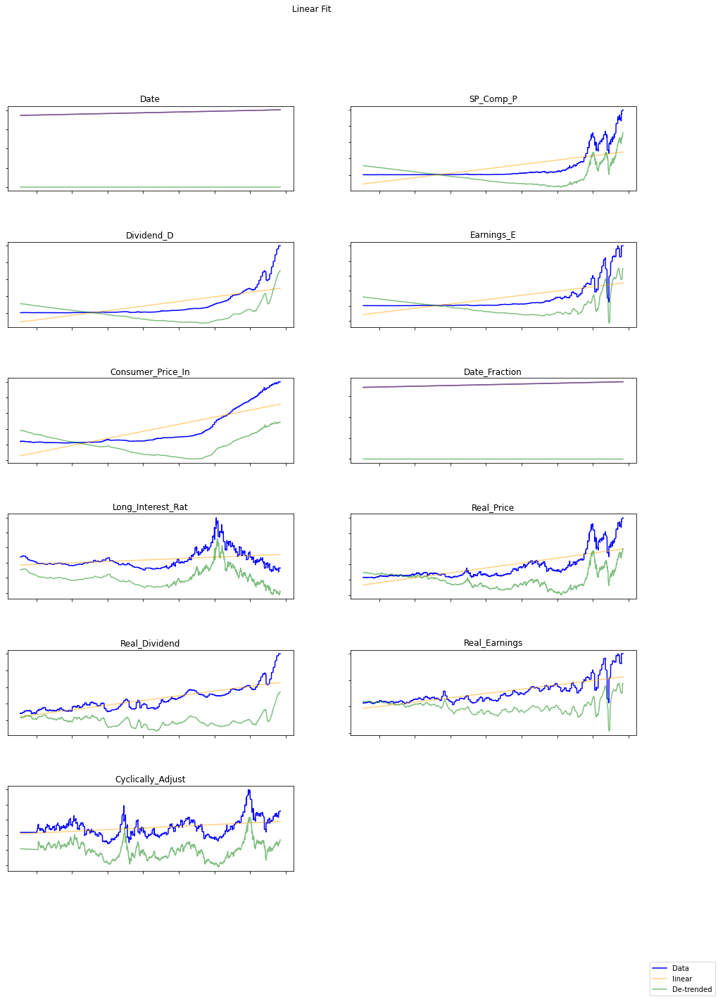

In [26]:
finClass.plotAllColumns("Linear Fit", 1)

The Real_Price column is chosen for further analysys:
#### Initial Linear Fit:
- Plots the data, the result of linear fitting, and the result of the data with linear fit subtracted.

#### Final Linear Fit:
- Performs a log base 10 on the data to even out the highs and lows.
- repeatedly performs a linear regression on the data and subtracts it until the
  change in regression is stationary.
- The final de-trended plot, erforms exp on the data to reverse the log effect to get a version of data for further analysis.

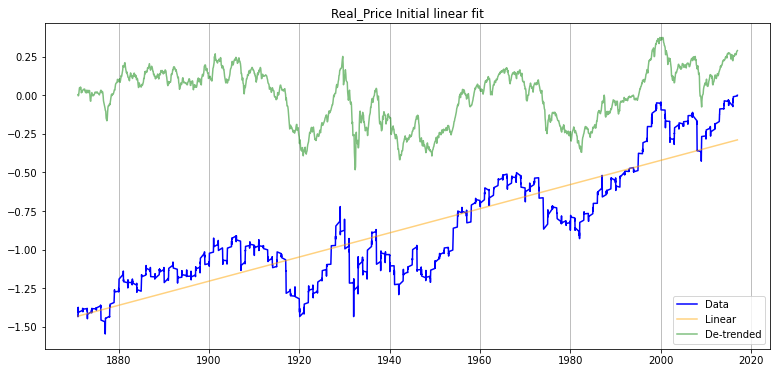

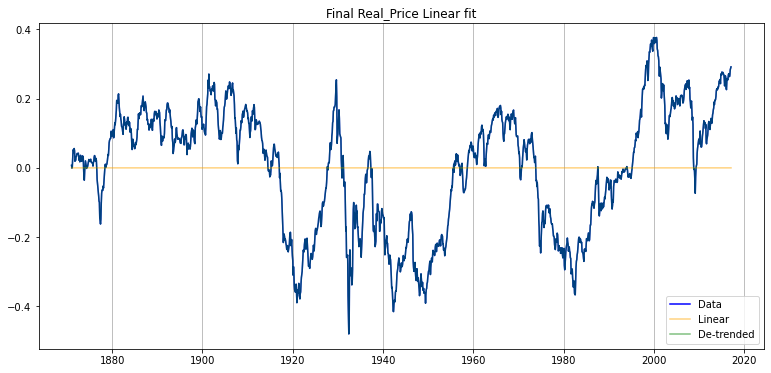

Fit count: 2 slope -6.6394558557180945e-18 lastSlope -6.823127648446987e-17


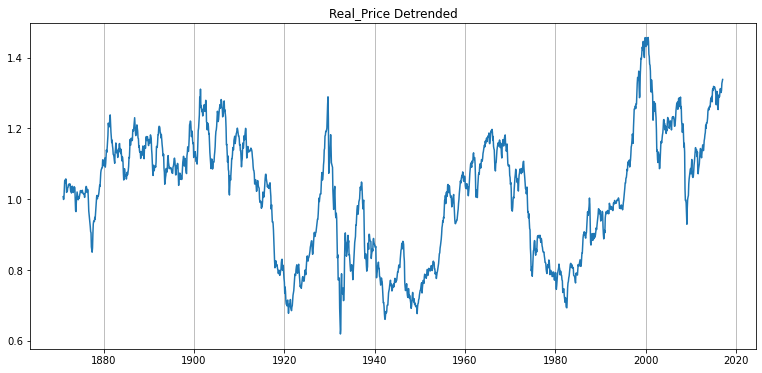

array([1.00717858, 0.99922218, 1.00271241, ..., 1.32759857, 1.33392129,
       1.33858443])

In [27]:
plt.rcParams['figure.figsize'] = (13,6) # reset image sizes to a smaller scale
finClass.deTrend("Real_Price")

#### Notes:
The long term trend of the Real_Price is upwards, but there are some significant drops that take several years to recover.

Next, a Class that wraps Prediction is implemented to perform Fourrier analysys on the de-trended data

In [59]:
from dsp_ap.operations import circ_convolve
from scipy import fft, signal

class FinancialFft:
    # The class attempts to perform a Fourrier analysis of the data

    # constructor
    # financialClassInstance a FinancialDataClass instance with data preloaded
    def __init__(self, financialClassInstance):
        self.financial = financialClassInstance
        self.columnData = self.financial.deTrend("Real_Price", False)
        self.columnData, self.dates = self.padToPower2Length(self.columnData, self.financial.getColumnData("Date"))

    # make sure signal length is power of 2, pad with zero's if not to
    # make the length a power of 2
    def padToPower2Length(self, data, dates):
        length = len(data)
        while True:
            root = int(math.sqrt(length))
            if root ** 2 == length:
                break
            data = np.append(data, 0.0)
            dates = np.append(dates, dates[-1]+1)
            length = length + 1
        return data, dates


    #
    # taken from lab5: plot a spectogram of the time signal (frequency over time, amplitude is the color)
    # time_signal samples to convert to frequency domain
    # samplerate: sampling rate of the signal
    # title the title to give to the plot
    def plot_spectrogram(self, time_signal, samplerate, title=''):
        frequencies, timepoints, specgram = signal.stft(time_signal, fs=samplerate, nperseg=1024)
        power_spectrogram = 20 * np.log10(np.abs(specgram) + np.finfo(float).eps)
        # adding a small number before applying log10 avoids divide by zero errors
        fig = plt.figure()
        plt.pcolormesh(timepoints, frequencies, power_spectrogram, vmin=-99, vmax=0)
        plt.title(title)
        plt.ylabel('frequency [months]')
        plt.xlabel('time [Years]')
        #     plt.xlim(0.5e7, 0.7e7) # adjust the x-axis to zoom in on a specific time region
        #     plt.xlim(5e7, 5.5e7)
        #     plt.ylim(0, 0.0005) # adjust the y-axis range to zoom in on low frequencies
        fig.show()

    # Plot a power spectrogram of the column data
    def plotColumnSpectrum(self, columnName):
        self.plot_spectrogram(self.columnData, 12, "Yearly Frequency Spectrum")

    # Look for periodicity (code taken from Lab 8, and modified)
    # startMonth the start month of the section to use for predicting
    # months: the number of months to extract, starting at startMonth, to use for trining
    # harmonic threshold: the harmonic model plot has several peak, be selecting a threshold, amplitudes below threshold
    #
    # Plots the frequencu spectrum of the selected data excerpt, plots the spectrum with the threshold filtered out,
    # uses the filtered spectrum to predict the data, which is plotted, in the third plot, along with the section extracted for
    # training, and the original data
    def lookForPeriodic(self, startMonth, months, harmonicThreshold):
        excerpt = self.columnData[startMonth:startMonth + months]
        dateExcerpts = self.dates[startMonth:startMonth + months]
        avg = np.mean(excerpt)
        normalisedExcerpt = excerpt - avg
        harmonicModel = fft.rfft(normalisedExcerpt)

        plt.figure()
        plt.plot(np.abs(harmonicModel))
        plt.title("Harmonic model for months: 0..{}".format(months))
        plt.grid(axis="y")
        plt.xlabel("Month frequency")
        plt.show()

        threshold = harmonicThreshold
        predictionSpectrum = np.where(np.abs(harmonicModel) < threshold, 0, harmonicModel)
        plt.figure()
        plt.plot(np.abs(predictionSpectrum))
        plt.title("Prediction spectrum  for months: 0..{}".format(months))
        plt.grid()
        plt.show()

        prediction = fft.irfft(predictionSpectrum)

        testLengthFactor = 2  # expressed as number of times the excerpt length
        totalLength = (testLengthFactor + 1) * months

        trueSignal = self.columnData[:totalLength] - avg
        periodic_prediction = np.tile(prediction, testLengthFactor + 1)

        plt.figure()
        plt.plot(self.dates, trueSignal, label='true signal')
        plt.plot(dateExcerpts, normalisedExcerpt, label='used excerpt')
        # self.dates, periodic_prediction[0:len(self.dates)],
        startIndex = startMonth
        length = min(len(self.dates), len(periodic_prediction))
        plt.plot(self.dates[startMonth:length], periodic_prediction[startMonth:length], label='periodic prediction')
        plt.legend(loc='lower left')
        plt.grid()
        plt.show()
        unseenData = trueSignal[months:]
        predictData = periodic_prediction[-len(unseenData):]
        rmse = np.sqrt(np.mean(np.power(unseenData - predictData, 2)))
        print(rmse)

The spectrogram of the price data over time is displayed below, a pattern that seems to match the first rise for
40 years, followed by a volatile 20 years, and another volatile 20 years, before rising again.

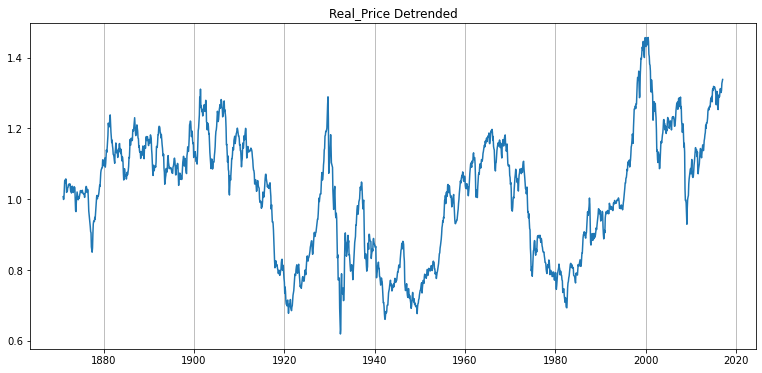

C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:38: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
C:\Users\jacqu\anaconda3\envs\DSP_Labs\lib\site-packages\ipykernel_launcher.py:45: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


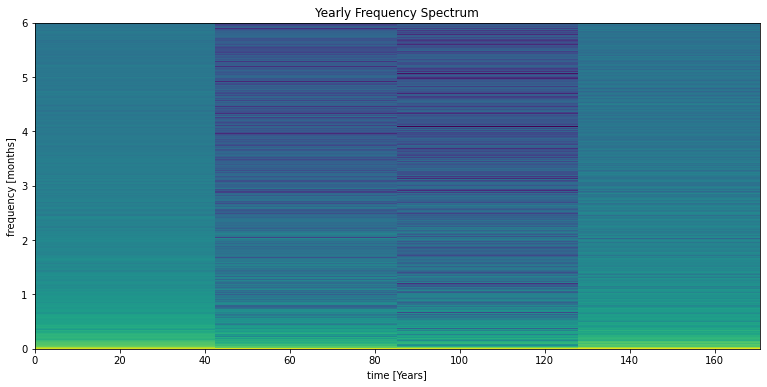

In [60]:
finFftClass = FinancialFft(finClass)
finFftClass.plotColumnSpectrum("Real_Price")

#### Look for periodicity (code taken from Lab 8, and modified)

Plots the frequency spectrum of the selected data excerpt, plots the spectrum of the excerpt with the threshold filtered out,
uses the filtered spectrum to predict the data, which is plotted, in the third plot, along with the section extracted for
training, and the original data.

startMonth the start month of the section to use for predicting
months: the number of months to extract, starting at startMonth, to use for trining
harmonic threshold: the harmonic model plot has several peak, be selecting a threshold, amplitudes below threshold

The first run uses the start of the data to 1930 (approx) for training. The threshold to use for filtering was deduced
as 10 from the harmonic model graph.

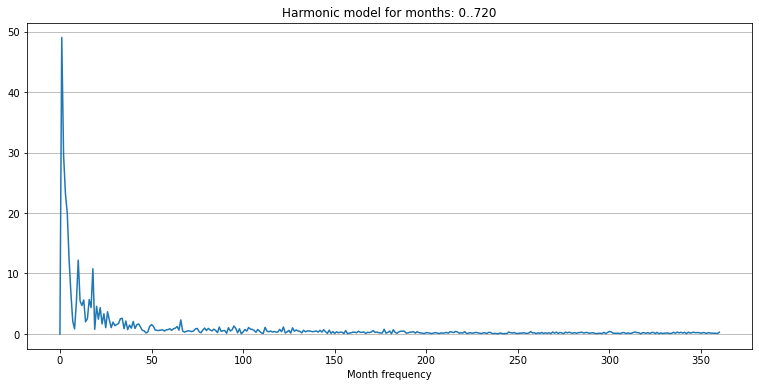

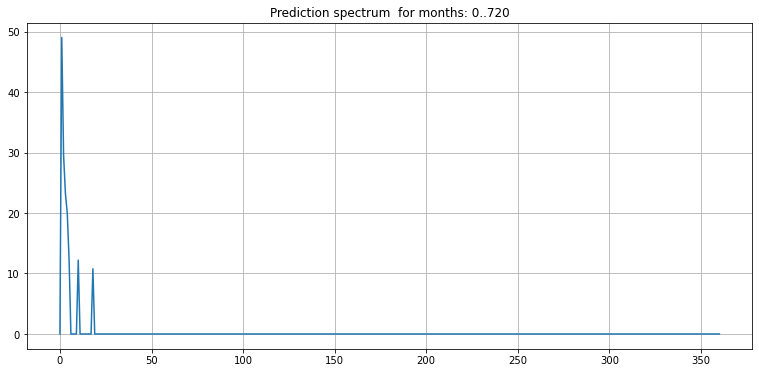

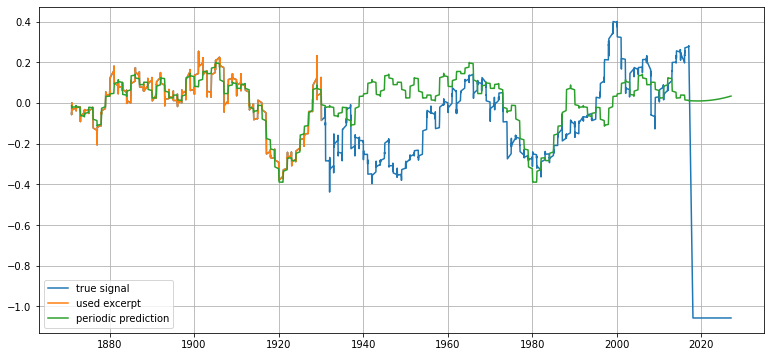

0.26619530645118605


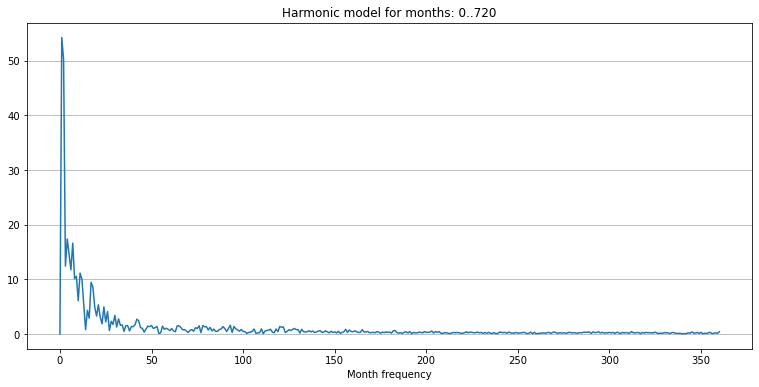

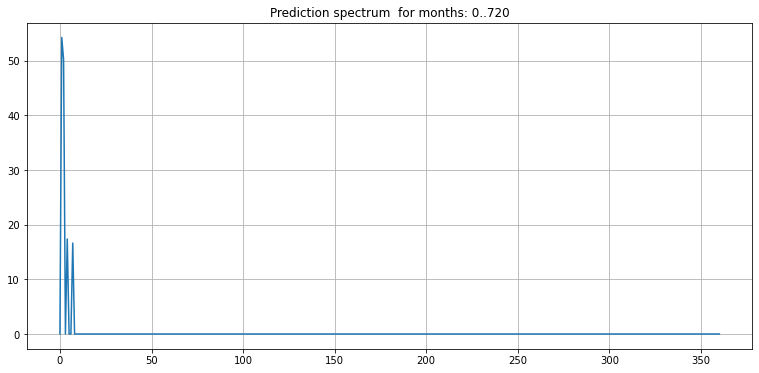

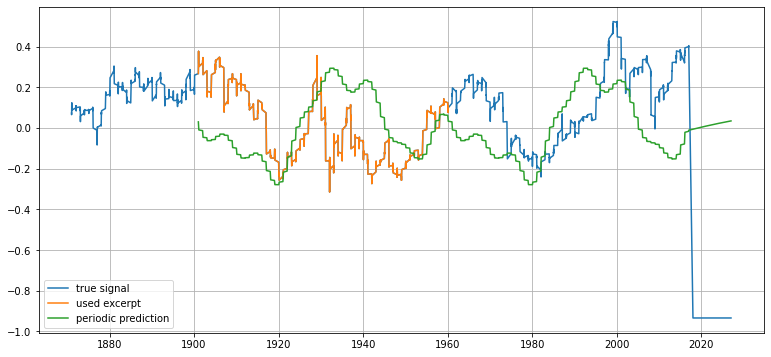

0.2506228110030925


In [61]:
finFftClass.lookForPeriodic(0, 12*60, 10)

The second run uses 1900 to 1960 as the training excerpt to use for training.

In [ ]:
finFftClass.lookForPeriodic(30*12, 12*60, 15)

Conclusion, whilst an interesting concept, using the Fourrier transformation for share price prediction is not very acurate.
This agrees with the paper by Bohuml et al. which found that fourrier analysis does not provide an advantage for investors who wish to
predict the price movements of investment instruments such as shares.

Stádník, Bohumil & Raudeliuniene, Jurgita & Davidavičienė, Vida. (2016). Fourier Analysis for Stock Price Forecasting: Assumption and Evidence. Journal of Business Economics and Management. 17. 365-380. 10.3846/16111699.2016.1184180.